# NYC Capital Projects

## Notebook 05: UMAP encoding of the BERT textual embeddings and UMAP + HDBSCAN project reference class clustering 

In this notebook, the [uniform manifold approximation and projection (UMAP)](https://arxiv.org/abs/1802.03426) algorithm is applied to our training data textual description embeddings, reducing the 512 dimension BERT embeddings to an encoded 2-dimensional feature we can use while training and testing our models.

Additionally, similar to our use of $k$-means clustering in Notebook 03 to generate a set of project "references classes", we generate a competing set of reference classes in this notebook. We accomplish this by employing a combination of UMAP dimensionality reduction and [HDBSCAN clustering](https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html) (an hierarchical version of DBSCAN) on the attributes associated with each project in our training dataset.

**WARNING:**

**The current version of this notebook needs to be fixed and refactored.** It currently contains several bugs preventing it from successfully outputting the final set of engineered feature data. For that reason, the project repository currently contains a copy of the original output data from this notebook for use as input in subesequent project notebooks. This notebook must, however, still be run from start to finish to generate the fitted models and serialized Python object outputs required as inputs for subsequent notebooks.

### Project authors

- [An Hoang](https://github.com/hoangthienan95)
- [Mark McDonald](https://github.com/mcdomx)
- [Mike Sedelmeyer](https://github.com/sedelmeyer)


### Inputs:

The following files are required to successfully run this notebook.

- ``../data/interim/embeddings_uncased_L-2_H-128_A-2.csv``

    The BERT embeddings for each capital project's textual description.
    

- ``../data/interim/NYC_capital_projects_3yr_train.csv``

    The training split of our 3-year interval subsetted project data.


- ``../data/interim/NYC_capital_projects_3yr_test.csv``

    The test split of our 3-year interval subsetted project data.


### Outputs:

The following files are generated by executing the code in this notebook.

**Data files**

- ``../data/interim/UMAP_embeddings_NYC_capital_projects_3yr_train.csv``

    The UMAP 2-dimensional encoded embeddings and the UMAP+HDBSCAN reference class cluster labels corresponding to each project record in our 3-year training split.


- ``../data/interim/UMAP_embeddings_NYC_capital_projects_3yr_test.csv``

    The UMAP 2-dimensional encoded embeddings and the UMAP+HDBSCAN reference class cluster labels corresponding to each project record in our 3-year test split.


**Fitted models and serialized Python objects, saved via ``pickle``**

Additional details regarding each of these outputs will be added when this notebook is fixed and refactored.

- ``../models/UMAP_fitted_robust_scaler.pickle``


- ``../models/UMAP_fitted_HDBSCAN.pickle``


- ``../models/UMAP_final_cols.pickle``


- ``../models/UMAP_mapper_dict.pickle``


- ``../models/clustering_X.pickle``


# Notebook contents

1. [Imports](#Imports)

2. [Read data](#Read-data)

3. [Dimensionality reduction](#Dimensionality-reduction)

4. [Clustering](#Clustering)

5. [Find clusters' characteristics](#Find-clusters'-characteristics)

6. [Clustering embeddings](#Clustering-embeddings)

# Imports

[Return to top](#Notebook-contents)

In [2]:
import glob
from math import pi
from pickle import dump, load

import hdbscan
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.io as pio
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import seaborn as sns
import sklearn
from tqdm.auto import tqdm
from umap import UMAP

from caproj import utils

init_notebook_mode()
pio.renderers.keys()
pio.renderers.default = 'notebook'

%matplotlib inline

# Improve resolution of output graphcis
%config InlineBackend.figure_format ='retina'

# Read data

All the data loaded from disk and used in this notebook

[Return to top](#Notebook-contents)

In [8]:
columns= ['PID', 'Project_Name', 'Description', 'Category', 'Borough',
       'Managing_Agency', 'Client_Agency', 'Phase_Start',
       'Current_Project_Years', 'Current_Project_Year', 'Design_Start',
       'Budget_Start', 'Schedule_Start', 'Final_Change_Date',
       'Final_Change_Years', 'Phase_End', 'Budget_End', 'Schedule_End',
       'Number_Changes', 'Duration_Start', 'Duration_End', 'Schedule_Change',
       'Budget_Change', 'Schedule_Change_Ratio', 'Budget_Change_Ratio',
       'Budget_Abs_Per_Error', 'Budget_Rel_Per_Error', 'Duration_End_Ratio',
       'Budget_End_Ratio', 'Duration_Ratio_Inv', 'Budget_Ratio_Inv']

In [9]:
use_entire_data = False
data_name = "../data/interim/NYC_capital_projects_3yr_train.csv" #"NYC_capital_projects_3yr"
embedding_file = "../data/interim/embeddings_uncased_L-2_H-128_A-2.csv"

In [10]:
data_dict = {}
for file in sorted(glob.glob("../data/interim/*.csv")):
    file_name = file.split("/")[-1].split(".")[0]
    if file_name.startswith("NYC"):
        date_cols = [
    'Design_Start',
    'Final_Change_Date',
    'Schedule_Start',
    'Schedule_End',
]
    else:
        date_cols = []
    data_dict[file_name] = pd.read_csv(file, parse_dates=date_cols)
data_dict.keys()

dict_keys(['Capital_Projects_clean', 'Capital_Projects_pid', 'Capital_Projects_pid_melted', 'NYC_capital_projects_3yr', 'NYC_capital_projects_3yr_test', 'NYC_capital_projects_3yr_train', 'NYC_capital_projects_all'])

In [11]:
if use_entire_data:
    df = data_dict[data_name]
else:
    date_cols = [
    'Design_Start',
    'Final_Change_Date',
    'Schedule_Start',
    'Schedule_End',
]
    df = pd.read_csv(data_name, parse_dates=date_cols)[columns + ["Category_Old"]]
    df = df.drop(columns="Category").rename(columns={"Category_Old": "Category"})
df.head()

,PID,Project_Name,Description,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,...,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv,Category
0,204,Edgewood Triangle Roadway Reconstruction,Reconstruct roadway and extend storm and sanit...,Queens,DDC,DOT,2-Design,6.546336,7,2013-02-13,...,4772000.0,0.316707,0.169605,0.145010,0.169605,1.316707,1.169605,-0.240530,-0.145010,Streets and Roadways
1,577,Bronx Public School 19 Addition,Design and construction of a new school,Bronx,SCA,DOE,2-Design,2.943250,3,2016-09-21,...,4852287.0,-0.023020,0.084005,0.077495,0.084005,0.976980,1.084005,0.023562,-0.077495,Schools
2,664,"NEW STRM SWR & WM REPLACEMENT IN ACACIA AVE, ETC.",New Strom Sewer extension & Water Main replace...,Staten Island,DDC,DEP,3-Construction Procurement,4.747531,5,2014-12-02,...,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,Sewers
3,402,Green Infrastructure Construction,Design and construction of right-of-way green ...,Citywide,EDC,DEP,2-Design,6.417654,7,2013-04-01,...,48000000.0,1.066423,0.145455,0.126984,0.145455,2.066423,1.145455,-0.516072,-0.126984,Sewers
4,760,"Construction Of Sanitary Sewers, Storm Sewers (Bm","Construction of storm sewers, sanitary sewers,...",not_specified,DDC,DEP,2-Design,3.006222,4,2016-08-29,...,20759000.0,0.074976,0.634657,0.388251,0.634657,1.074976,1.634657,-0.069746,-0.388251,Sewers


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   PID                    134 non-null    int64         
 1   Project_Name           134 non-null    object        
 2   Description            134 non-null    object        
 3   Borough                134 non-null    object        
 4   Managing_Agency        134 non-null    object        
 5   Client_Agency          134 non-null    object        
 6   Phase_Start            134 non-null    object        
 7   Current_Project_Years  134 non-null    float64       
 8   Current_Project_Year   134 non-null    int64         
 9   Design_Start           134 non-null    datetime64[ns]
 10  Budget_Start           134 non-null    float64       
 11  Schedule_Start         134 non-null    datetime64[ns]
 12  Final_Change_Date      134 non-null    datetime64[ns]
 13  Final

**Read BERT embedding of project descriptions**

In [13]:
embedding = pd.read_csv(embedding_file)
embedding
embedding_expanded = embedding["embedding"].str.split(",", expand=True)
embedding_expanded.columns = [f"description_embedding_original" for num in embedding_expanded.columns]
embedding = embedding.join(embedding_expanded)
embedding = embedding.drop_duplicates("PID")
embedding

,PID,embedding,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,...,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original
0,3,"-0.13854653, 1.4585932, -6.7886453, 0.06109361...",-0.13854653,1.4585932,-6.7886453,0.061093614,0.7148117,0.43594462,-0.23744068,0.3534081,...,1.151537,1.329929,1.3608555,2.953014,2.9410653,0.8604974,-0.19378448,-0.34349686,0.2708969,3.2138045
1,7,"-0.13127574, 1.1954153, -6.7207437, 0.06122951...",-0.13127574,1.1954153,-6.7207437,0.06122951,0.80961025,0.44387937,-0.09895813,0.39786565,...,1.027053,1.0824411,1.2738218,2.5434253,2.2992206,-0.11788054,0.2098028,-0.41049436,-0.36708057,2.9890614
2,18,"0.09863796, 1.6704285, -6.5727553, 0.06882739,...",0.09863796,1.6704285,-6.5727553,0.06882739,0.77206296,0.55682564,-0.441742,0.90105414,...,1.1086549,0.42101243,0.8899111,2.3709288,1.8500209,0.9128254,-1.9147136,-1.4002768,-0.16849239,1.2008964
3,25,"-0.26632923, 1.1822444, -6.7360897, 0.06842376...",-0.26632923,1.1822444,-6.7360897,0.06842376,0.6305313,0.452769,-0.35671887,0.54343706,...,0.54704213,1.4249201,1.4830925,2.158951,3.4316707,1.8173983,-0.49943078,-0.39554152,0.07995346,1.7075143
4,34,"-0.35451388, 1.6325428, -6.692406, 0.10146355,...",-0.35451388,1.6325428,-6.692406,0.10146355,0.7334988,0.3255136,-0.4081904,0.46820372,...,0.80529124,0.6769039,1.2790774,2.6454213,1.3743583,1.5485067,-0.5840663,-0.6730428,0.11817476,1.9487768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,1010,"-0.52122164, 0.79554, -6.5958495, -0.081063874...",-0.52122164,0.79554,-6.5958495,-0.081063874,0.77371645,0.26616392,0.21820915,0.82970876,...,0.7960796,1.2650403,-0.58566713,1.1250001,2.5820584,0.043057263,-0.9837406,-1.3096954,-0.5665225,2.1851
351,1011,"-0.5042876, 1.3092326, -6.3450904, -0.00273898...",-0.5042876,1.3092326,-6.3450904,-0.0027389843,0.16145726,1.0352757,0.022692595,0.35591787,...,1.0485785,0.88635474,-0.12855649,1.2052771,1.3434412,-0.8946722,-0.71620286,-1.0272563,-0.84701586,-0.19701514
352,1012,"-0.26597434, 0.7131422, -6.515089, 0.060628086...",-0.26597434,0.7131422,-6.515089,0.060628086,0.42196584,-0.05683732,0.23194067,0.6219945,...,0.75413245,0.30441406,0.35155532,0.91175866,2.2456338,0.82656425,-0.5816655,-1.5615482,-1.1400889,1.2630918
353,1013,"0.04595404, 0.8282617, -6.6184716, 0.062359072...",0.04595404,0.8282617,-6.6184716,0.062359072,0.632768,-0.0020858943,-0.35882196,0.47291726,...,0.7529411,1.2598354,1.5513313,2.190104,4.0918245,1.7823071,-0.6352134,0.6469984,0.23102793,2.7462115


# Dimensionality reduction

[Return to top](#Notebook-contents)

## Step 1: Scaling numeric columns

In [14]:
df_to_transform = df.select_dtypes(["int64", "float64"]).drop(columns=["PID"])
transformer = sklearn.preprocessing.RobustScaler().fit(df_to_transform)
transformed_columns = pd.DataFrame(transformer.transform(df_to_transform), columns = df_to_transform.columns)
scaled_df = (df[df.columns.difference(transformed_columns.columns)]).join(transformed_columns)

### Columns that need to be scaled

In [15]:
df_to_transform.columns

Index(['Current_Project_Years', 'Current_Project_Year', 'Budget_Start',
       'Final_Change_Years', 'Budget_End', 'Number_Changes', 'Duration_Start',
       'Duration_End', 'Schedule_Change', 'Budget_Change',
       'Schedule_Change_Ratio', 'Budget_Change_Ratio', 'Budget_Abs_Per_Error',
       'Budget_Rel_Per_Error', 'Duration_End_Ratio', 'Budget_End_Ratio',
       'Duration_Ratio_Inv', 'Budget_Ratio_Inv'],
      dtype='object')

### Compare before and after scaling

In [16]:
df.describe()

,PID,Current_Project_Years,Current_Project_Year,Budget_Start,Final_Change_Years,Budget_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
count,134.000000,134.000000,134.000000,1.340000e+02,134.000000,1.340000e+02,134.000000,134.000000,134.000000,134.000000,1.340000e+02,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000
mean,552.231343,3.952700,4.522388,1.036175e+08,2.617460,1.251611e+08,3.701493,1943.447761,2271.529851,328.082090,2.154360e+07,0.212899,1.104728,0.266155,1.190864,1.212899,2.104728,-0.133172,-0.054861
std,207.686755,1.636764,1.611595,2.138336e+08,0.317748,2.610880e+08,1.823117,636.183564,684.049516,430.169053,1.017324e+08,0.315904,6.590630,0.685438,6.575499,0.315904,6.590630,0.170267,0.733596
min,3.000000,2.045217,3.000000,8.130000e+05,1.708454,1.024036e+07,0.000000,663.000000,1103.000000,-397.000000,-2.768796e+08,-0.171521,-0.884622,0.000000,0.000000,0.828479,0.115378,-0.587431,-0.983496
25%,448.500000,2.577055,3.000000,3.202025e+07,2.510661,3.572361e+07,3.000000,1502.250000,1809.000000,0.000000,0.000000e+00,0.000000,0.000000,0.026335,0.027048,1.000000,1.000000,-0.222846,-0.234284
50%,558.000000,3.415539,4.000000,4.652582e+07,2.713266,5.407350e+07,4.000000,1890.000000,2209.000000,212.500000,1.692611e+06,0.111429,0.034043,0.130074,0.125159,1.111429,1.034043,-0.100258,-0.032922
75%,671.750000,4.837197,5.000000,7.713400e+07,2.842632,9.667518e+07,5.000000,2247.750000,2611.250000,551.000000,2.294150e+07,0.286789,0.305980,0.320651,0.360099,1.286789,1.305980,0.000000,0.000000
max,1004.000000,8.561435,9.000000,1.910339e+09,2.998008,1.984467e+09,7.000000,4360.000000,5107.000000,2209.000000,8.078026e+08,1.423834,59.592113,7.667156,59.592113,2.423834,60.592113,0.207031,7.667156


In [17]:
scaled_df.describe()

,PID,Current_Project_Years,Current_Project_Year,Budget_Start,Final_Change_Years,Budget_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
count,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,1.340000e+02,134.000000,134.000000,1.340000e+02,1.340000e+02,134.000000
mean,552.231343,0.237667,0.261194,1.265505,-0.288598,1.166297,-0.149254,0.071694,0.077943,0.209768,0.865287,0.353812,3.499197,4.623620e-01,3.199820,0.353812,3.499197e+00,-1.477002e-01,-0.093647
std,207.686755,0.724186,0.805798,4.739877,0.957155,4.283532,0.911559,0.853365,0.852664,0.780706,4.434425,1.101519,21.539395,2.328918e+00,19.743189,1.101519,2.153939e+01,7.640561e-01,3.131224
min,3.000000,-0.606299,-0.500000,-1.013279,-3.026804,-0.719147,-2.000000,-1.645875,-1.378623,-1.106171,-12.142719,-0.986614,-3.002365,-4.419539e-01,-0.375794,-0.986614,-3.002365e+00,-2.186142e+00,-4.057356
25%,448.500000,-0.370987,-0.500000,-0.321533,-0.610309,-0.301057,-0.500000,-0.520121,-0.498598,-0.385662,-0.073779,-0.388541,-0.111258,-3.524742e-01,-0.294582,-0.388541,-1.112577e-01,-5.501026e-01,-0.859480
50%,558.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.683753e-17,0.000000,0.000000,3.627740e-16,3.113693e-17,0.000000
75%,671.750000,0.629013,0.500000,0.678467,0.389691,0.698943,0.500000,0.479879,0.501402,0.614338,0.926221,0.611459,0.888742,6.475258e-01,0.705418,0.611459,8.887423e-01,4.498974e-01,0.140520
max,1004.000000,2.276802,2.500000,41.313642,0.857732,31.670945,1.500000,3.313213,3.612340,3.623412,35.137634,4.576196,194.646767,2.560880e+01,178.551825,4.576196,1.946468e+02,1.378931e+00,32.866386


## Step 2: Dropping columns that are identifiers or unknown at inference time

In [18]:
identifier_columns = ["PID",  "Project_Name", "Description"]
drop_cols = ["Current_Project_Year",                          
            "Number_Changes",                          
            "Current_Project_Years",
            "Phase_End"]

In [19]:
dummified = pd.get_dummies(scaled_df.drop(columns=identifier_columns + drop_cols))
dummified[identifier_columns] = scaled_df[identifier_columns]
dummified= dummified[identifier_columns + list(dummified.columns.difference(identifier_columns + drop_cols))]
dummified.head()

,PID,Project_Name,Description,Borough_Bronx,Borough_Brooklyn,"Borough_Brooklyn, Queens",Borough_Citywide,Borough_Manhattan,"Borough_Manhattan, Bronx","Borough_Manhattan, Staten Island, Bronx",...,Managing_Agency_DSNY,Managing_Agency_EDC,Managing_Agency_SCA,Phase_Start_2-Design,Phase_Start_3-Construction Procurement,Phase_Start_4-Construction,Schedule_Change,Schedule_Change_Ratio,Schedule_End,Schedule_Start
0,204,Edgewood Triangle Roadway Reconstruction,Reconstruct roadway and extend storm and sanit...,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0.801270,0.715778,2020-07-25,2018-10-10
1,577,Bronx Public School 19 Addition,Design and construction of a new school,1,0,0,0,0,0,0,...,0,0,1,1,0,0,-0.447368,-0.468807,2020-09-03,2020-10-07
2,664,"NEW STRM SWR & WM REPLACEMENT IN ACACIA AVE, ETC.",New Strom Sewer extension & Water Main replace...,0,0,0,0,0,0,0,...,0,0,0,0,1,0,-0.385662,-0.388541,2020-05-07,2020-05-07
3,402,Green Infrastructure Construction,Design and construction of right-of-way green ...,0,0,0,1,0,0,0,...,0,1,0,1,0,0,2.265880,3.329948,2020-12-31,2016-12-31
4,760,"Construction Of Sanitary Sewers, Storm Sewers (Bm","Construction of storm sewers, sanitary sewers,...",0,0,0,0,0,0,0,...,0,0,0,1,0,0,-0.106171,-0.127110,2022-09-15,2022-04-14


In [20]:
dummified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 82 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   PID                                          134 non-null    int64         
 1   Project_Name                                 134 non-null    object        
 2   Description                                  134 non-null    object        
 3   Borough_Bronx                                134 non-null    uint8         
 4   Borough_Brooklyn                             134 non-null    uint8         
 5   Borough_Brooklyn, Queens                     134 non-null    uint8         
 6   Borough_Citywide                             134 non-null    uint8         
 7   Borough_Manhattan                            134 non-null    uint8         
 8   Borough_Manhattan, Bronx                     134 non-null    uint8         
 9  

### Drop columns that are related to either budget or schedule that can cause data leakage

In [21]:
budget_cols = ['Budget_Abs_Per_Error',
 'Budget_Change',
 'Budget_Change_Ratio',
 'Budget_End',
 'Budget_End_Ratio',
 'Budget_Ratio_Inv',
 'Budget_Rel_Per_Error',
 #'Budget_Start',
]

schedule_cols = ['Schedule_Change',
                 'Schedule_Change_Ratio',
                 'Duration_End', 
                 'Duration_End_Ratio',
                 'Duration_Ratio_Inv',
                 'Final_Change_Years'
                 #'Schedule_End', #not int or float
                 #'Schedule_Start' #not int or float
                ]


other_dropped_cols = [
    
]


#Number_Changes, Phase_End_3-Construction Procurement

### COLUMNS THAT WERE ONE-HOT ENCODED

In [22]:
columns_before_dummified = scaled_df.drop(columns=identifier_columns + drop_cols + budget_cols + schedule_cols +["Schedule_End", "Schedule_Start", "Design_Start", "Final_Change_Date"]).columns
columns_before_dummified

Index(['Borough', 'Category', 'Client_Agency', 'Managing_Agency',
       'Phase_Start', 'Budget_Start', 'Duration_Start'],
      dtype='object')

## Step 3: Unify one-hot-encoded columns

Since we need to make sure that we can use the UMAP mapping function on test samples, and since our data is sparse, test and train might not have the same Categories/Boroughs. We need to take the superset of all possible one hot encoding columns and fill them with 0s

In [23]:
all_cols_all_datasets = set()
for year in [3]:
    new_cols = set(pd.get_dummies(data_dict[f"NYC_capital_projects_{year}yr"][columns_before_dummified]).columns)
    all_cols_all_datasets = all_cols_all_datasets | new_cols
    
all_cols_all_datasets

{'Borough_Bronx',
 'Borough_Brooklyn',
 'Borough_Brooklyn, Queens',
 'Borough_Citywide',
 'Borough_Manhattan',
 'Borough_Manhattan, Bronx',
 'Borough_Manhattan, Staten Island, Bronx',
 'Borough_Marlboro',
 'Borough_New York',
 'Borough_Olive',
 'Borough_Port Jervis',
 'Borough_Queens',
 'Borough_Staten Island',
 'Borough_Valhalla',
 'Borough_not_specified',
 'Budget_Start',
 'Category_Arts and Culture',
 'Category_Bridges',
 'Category_Bridges, Streets and Roadways',
 'Category_Ferries',
 'Category_Health and Hospitals',
 'Category_Industrial Development',
 'Category_Industrial Development, Parks',
 'Category_Other Government Facilities',
 'Category_Parks',
 'Category_Parks, Streets and Roadways',
 'Category_Public Safety and Criminal Justice',
 'Category_Sanitation',
 'Category_Schools',
 'Category_Sewers',
 'Category_Streets and Roadways',
 'Category_Wastewater Treatment',
 'Category_Water Supply',
 'Client_Agency_BWS',
 'Client_Agency_DCAS',
 'Client_Agency_DCLA',
 'Client_Agency_DEP

In [24]:
dummified["PID"] = dummified["PID"].astype("category")

In [25]:
umap_df = dummified.select_dtypes([int, float, "uint8"]).drop(columns = budget_cols + schedule_cols)
umap_df.columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Budget_Start', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_

Columns that we will add into the dataframe to harmonize one hot encoding:

In [26]:
added_cols = all_cols_all_datasets - set(umap_df.columns)
added_cols = {col: 0 for col in added_cols}
added_cols

{'Client_Agency_DSBS': 0}

In [27]:
umap_df = umap_df.assign(**added_cols)

## Step 4: Try out a couple of UMAP configurations

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/umap/umap_.py:1679: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



CPU times: user 10.1 s, sys: 401 ms, total: 10.5 s
Wall time: 9.78 s


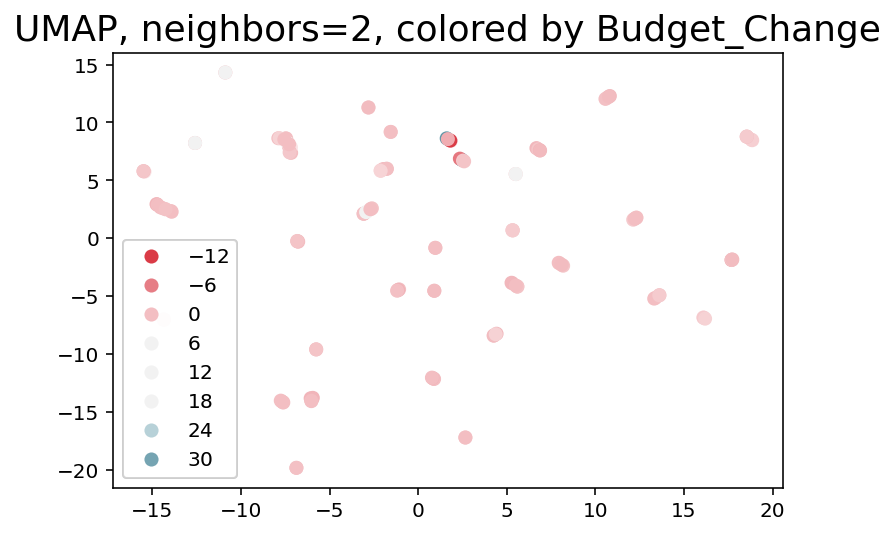

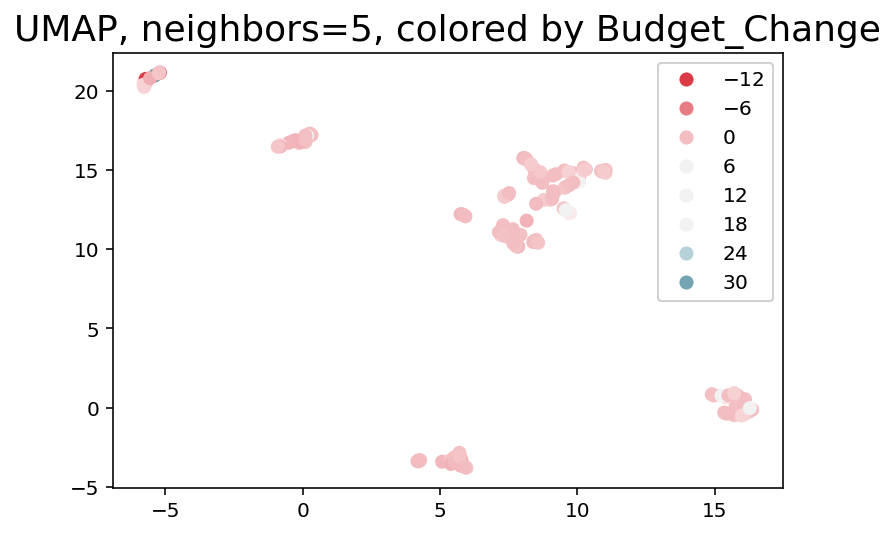

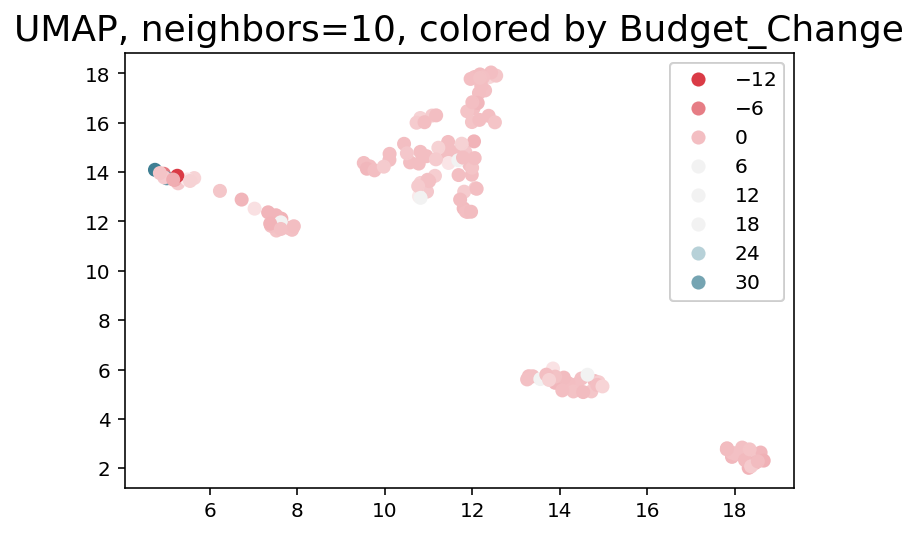

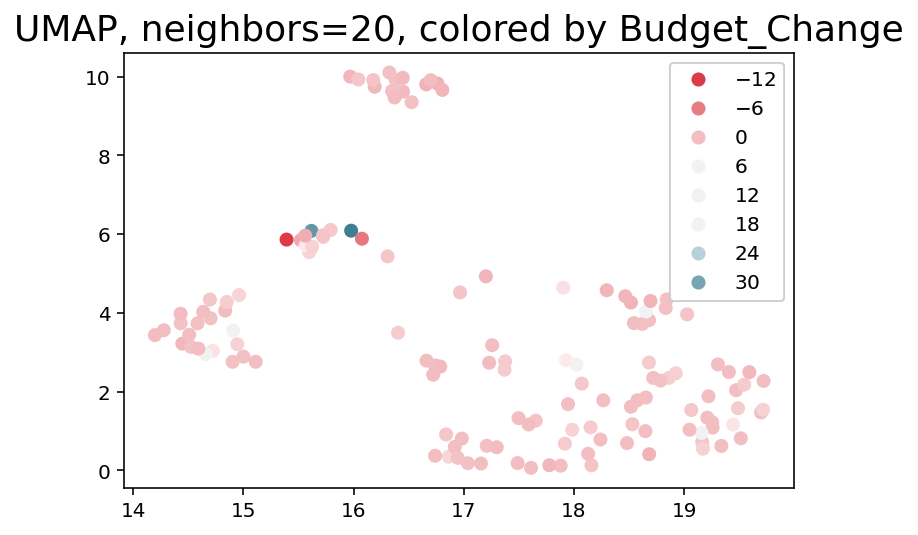

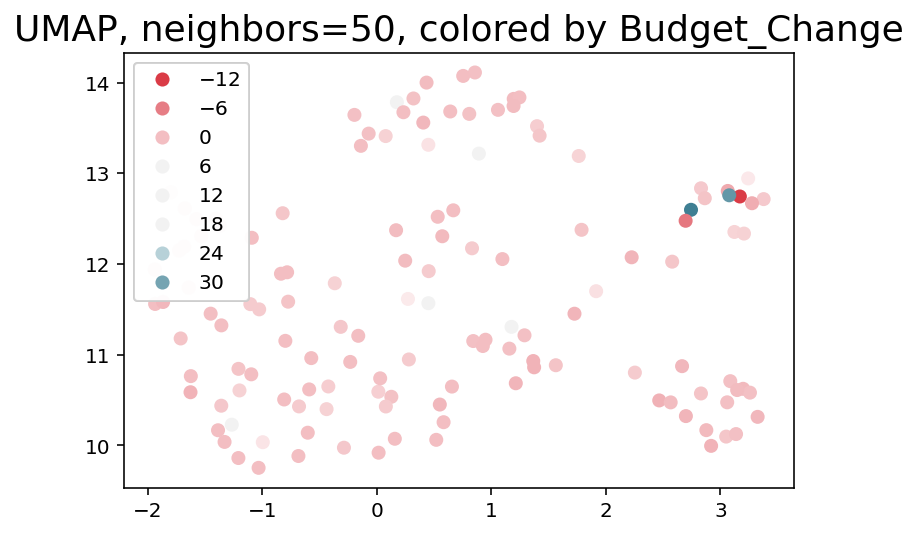

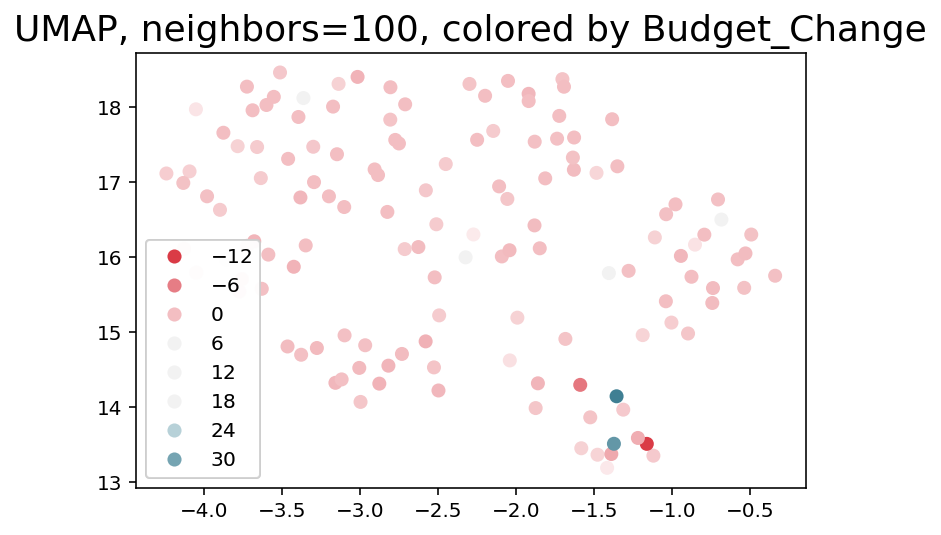

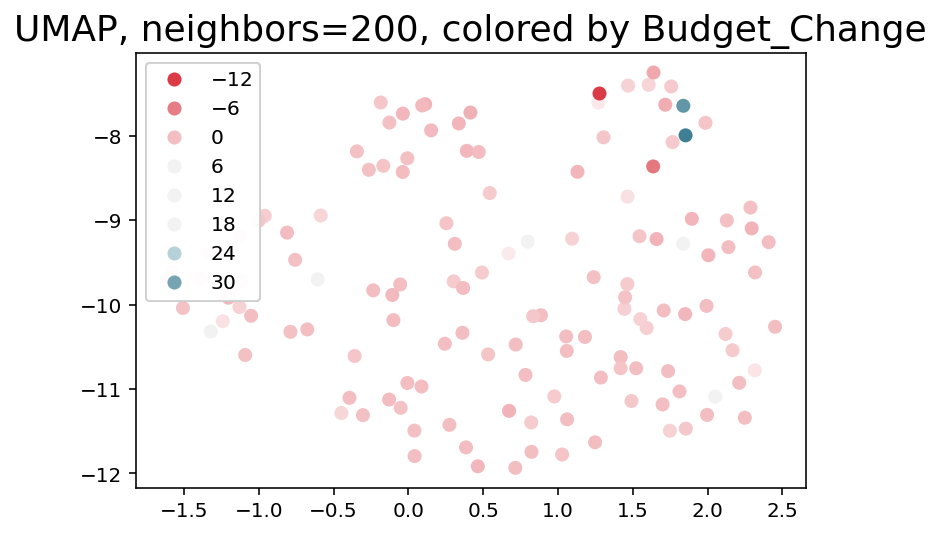

In [28]:
%%time

cmap = sns.diverging_palette(10, 220, sep=80, as_cmap=True) #sns.cubehelix_palette(as_cmap=True)

for n_neighbor in [2,5,10,20,50,100, 200]:
    utils.draw_umap(umap_df, n_neighbors=n_neighbor, c=dummified['Budget_Change'], cmap=cmap, title = f"UMAP, neighbors={n_neighbor}, colored by {dummified['Budget_Change'].name}")

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/umap/umap_.py:1679: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



CPU times: user 6.18 s, sys: 352 ms, total: 6.54 s
Wall time: 5.87 s


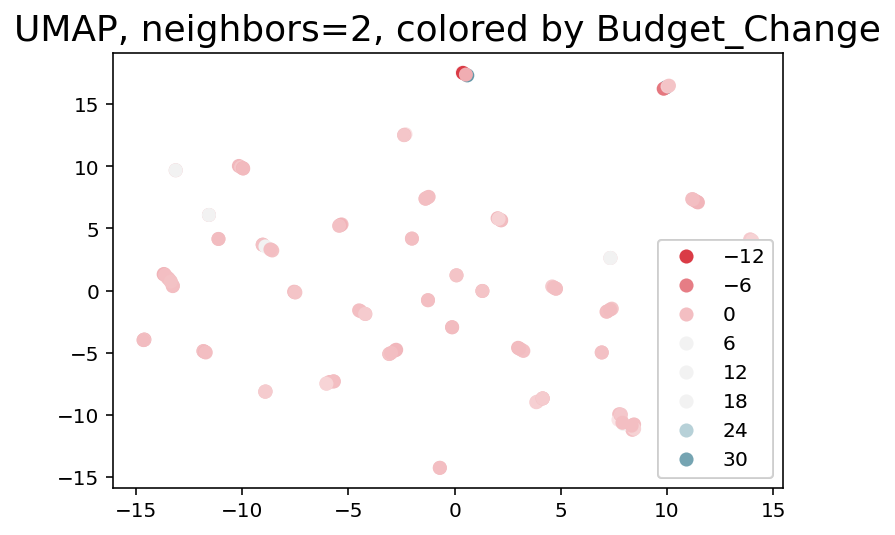

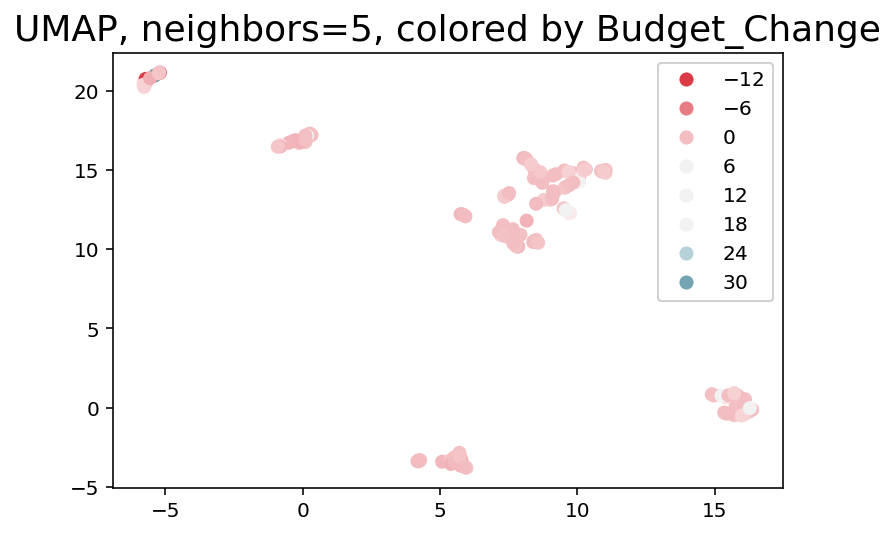

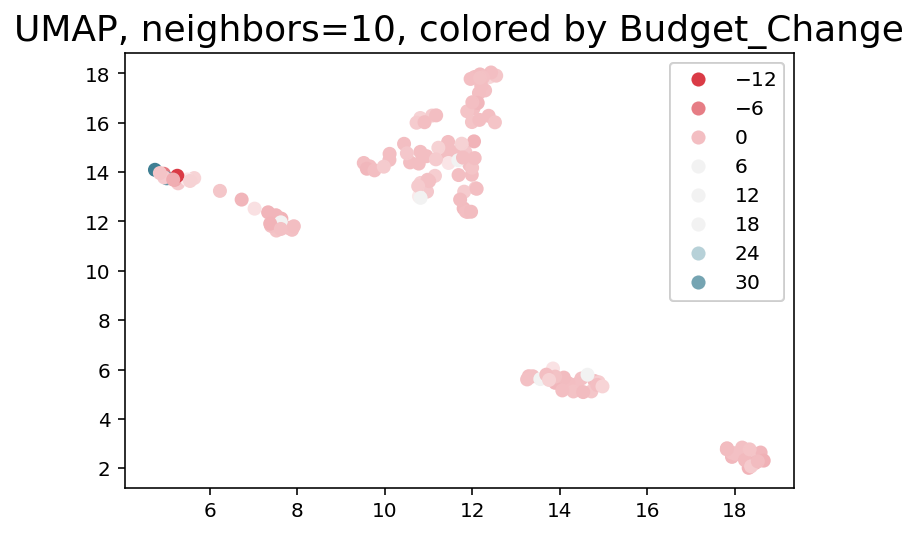

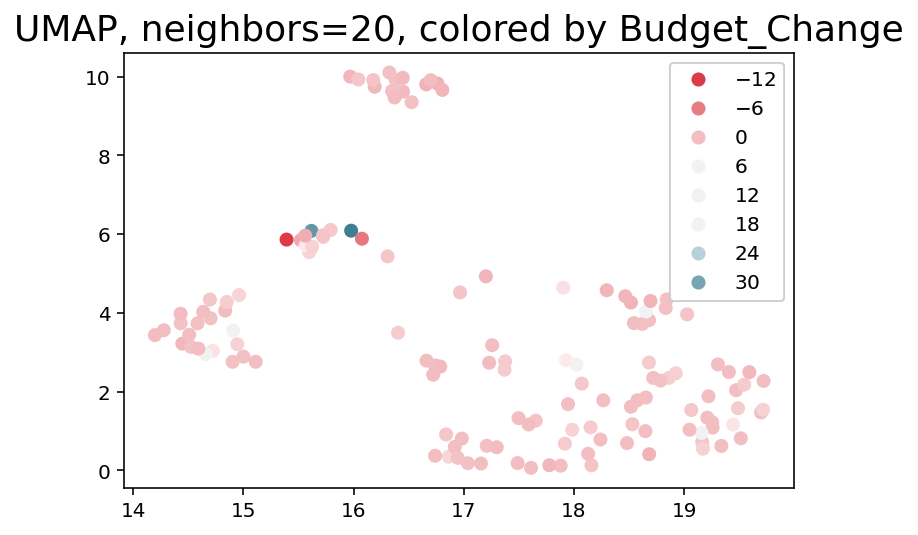

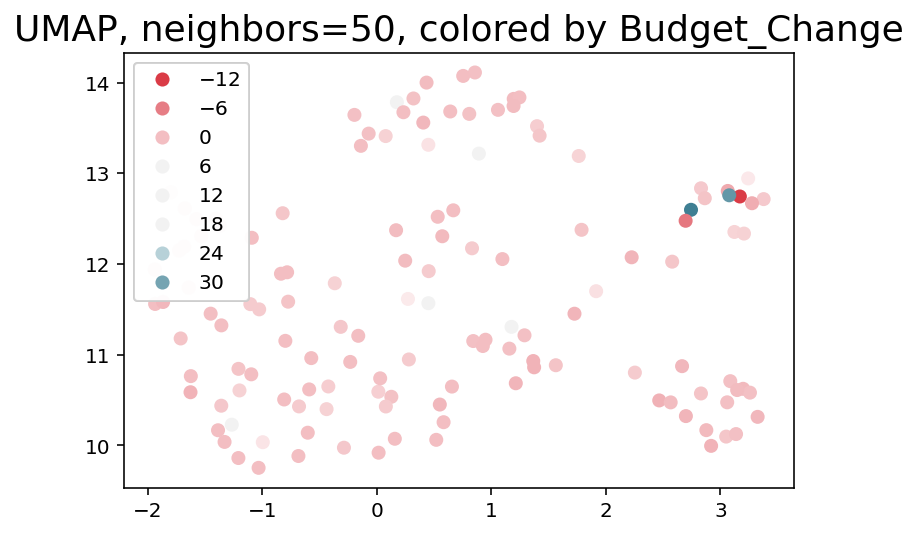

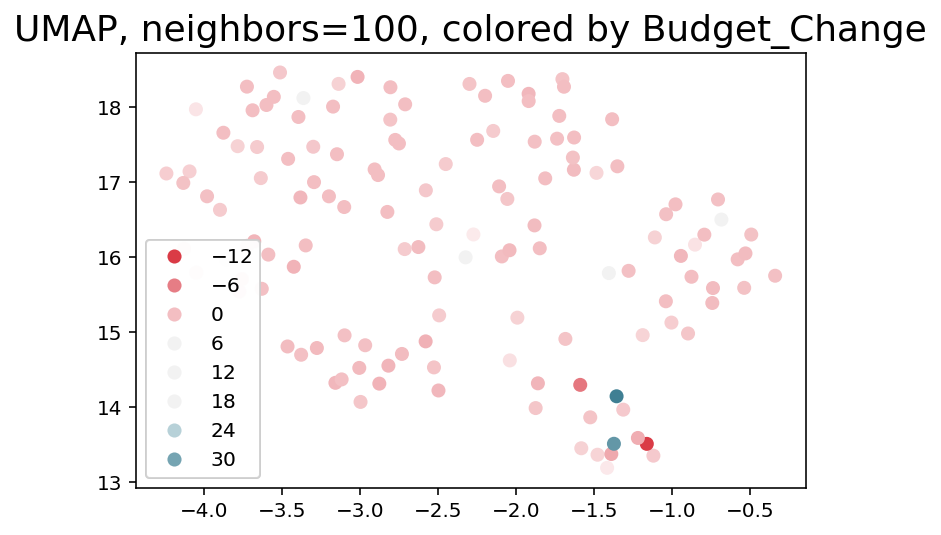

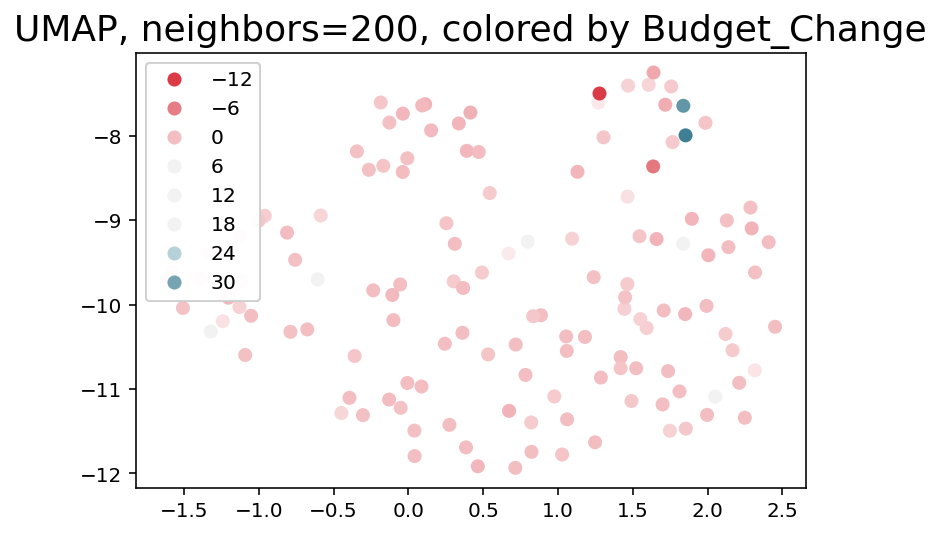

In [29]:
%%time

cmap = sns.diverging_palette(10, 220, sep=80, as_cmap=True) #sns.cubehelix_palette(as_cmap=True)

for n_neighbor in [2,5,10,20,50,100, 200]:
    utils.draw_umap(umap_df, n_neighbors=n_neighbor, c=dummified['Budget_Change'], cmap=cmap, title = f"UMAP, neighbors={n_neighbor}, colored by {dummified['Budget_Change'].name}")

<AxesSubplot:ylabel='Frequency'>

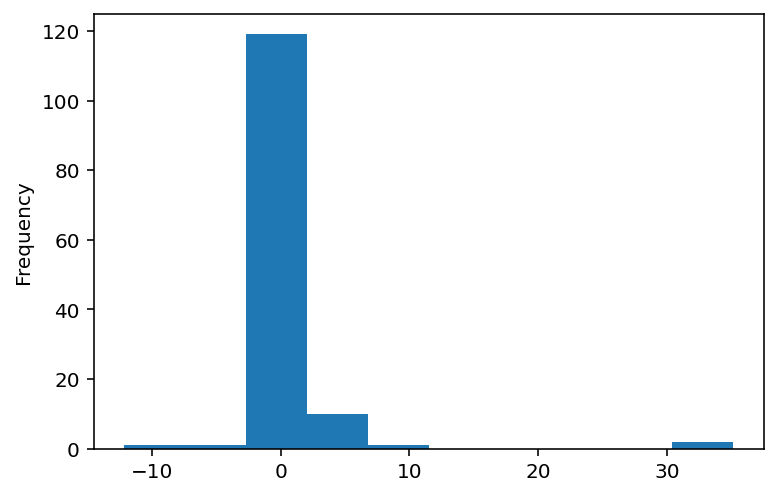

In [30]:
dummified['Budget_Change'].plot.hist()

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/umap/umap_.py:1679: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



CPU times: user 6 s, sys: 346 ms, total: 6.35 s
Wall time: 5.72 s


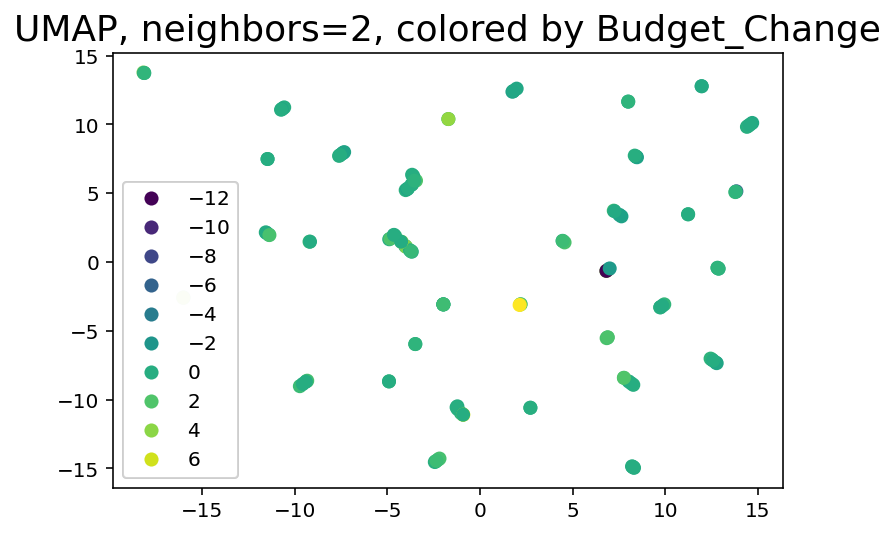

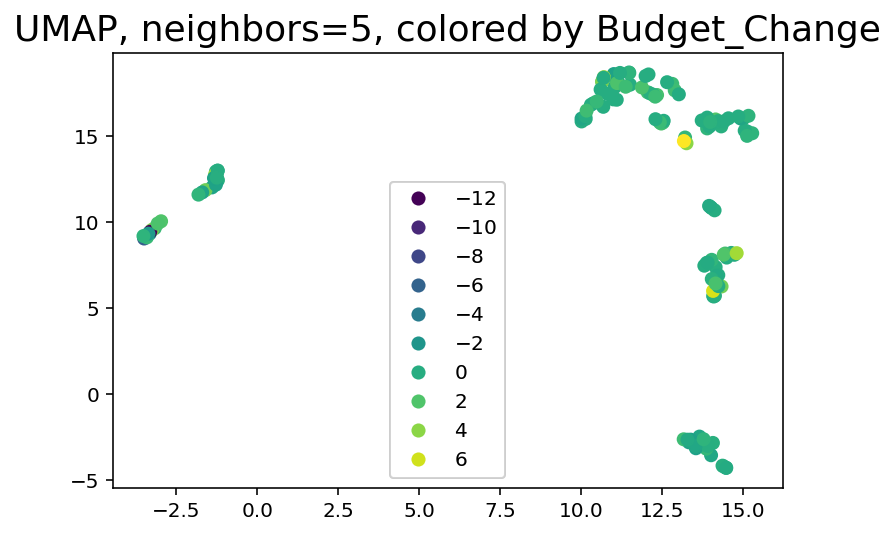

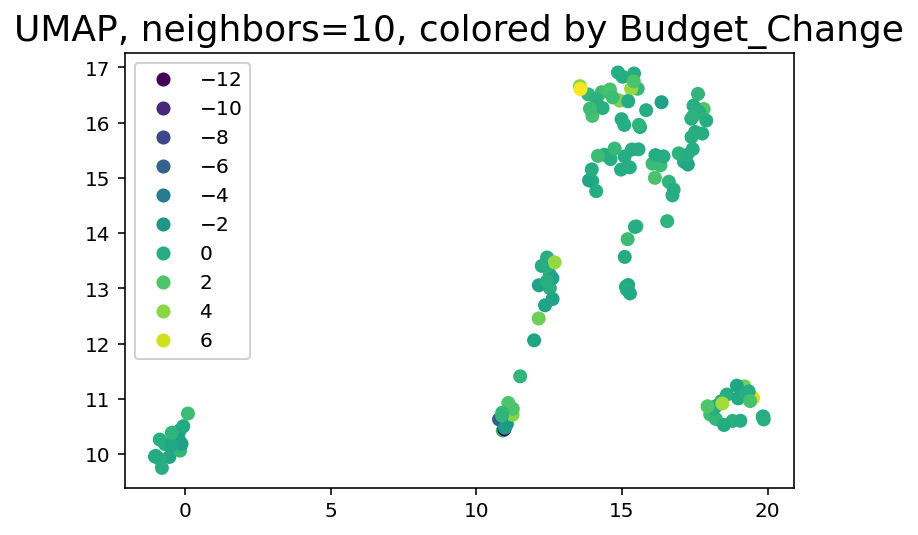

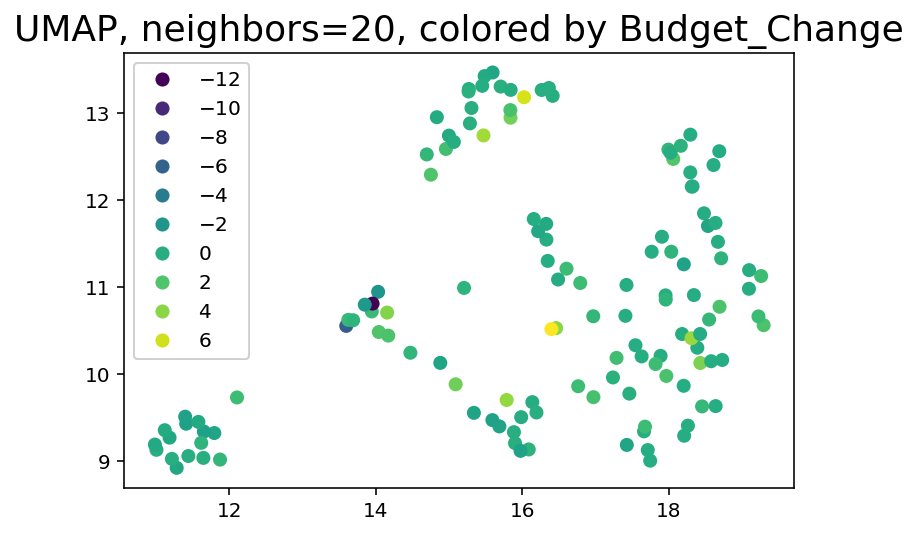

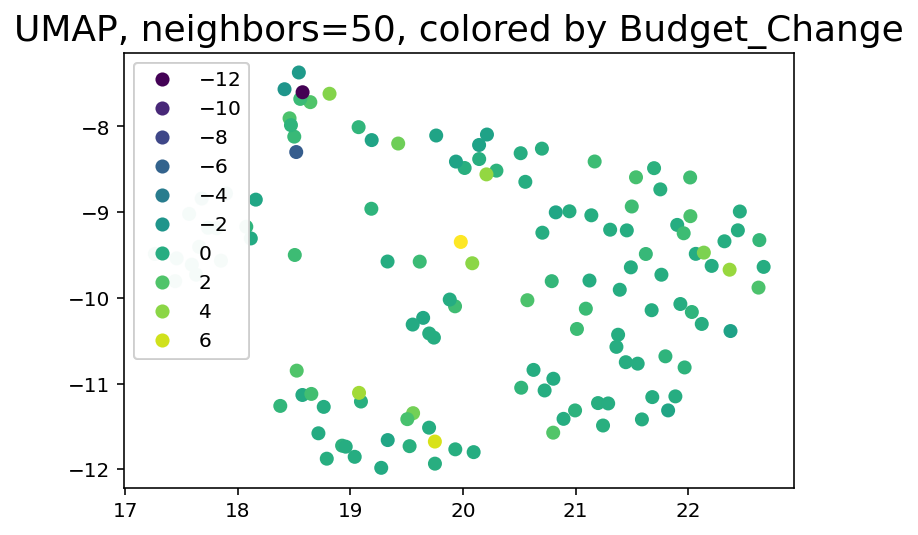

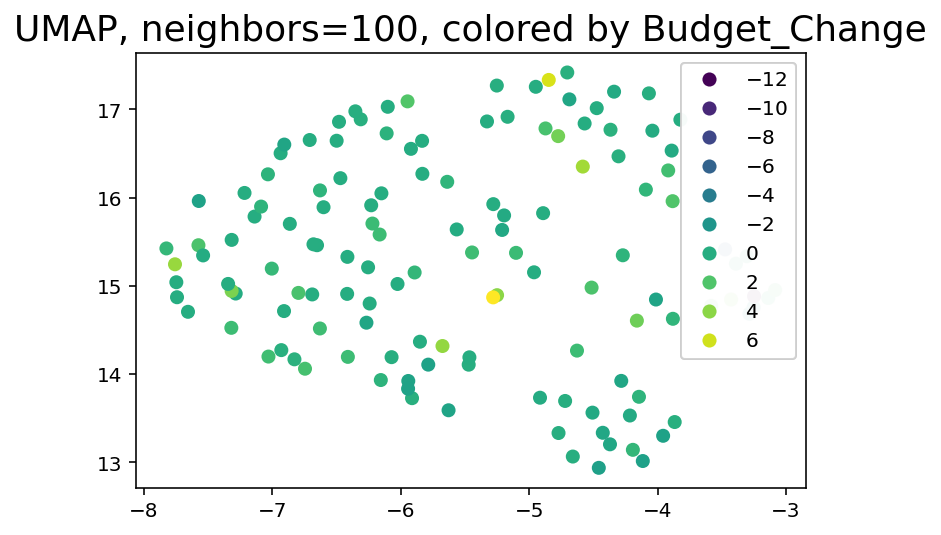

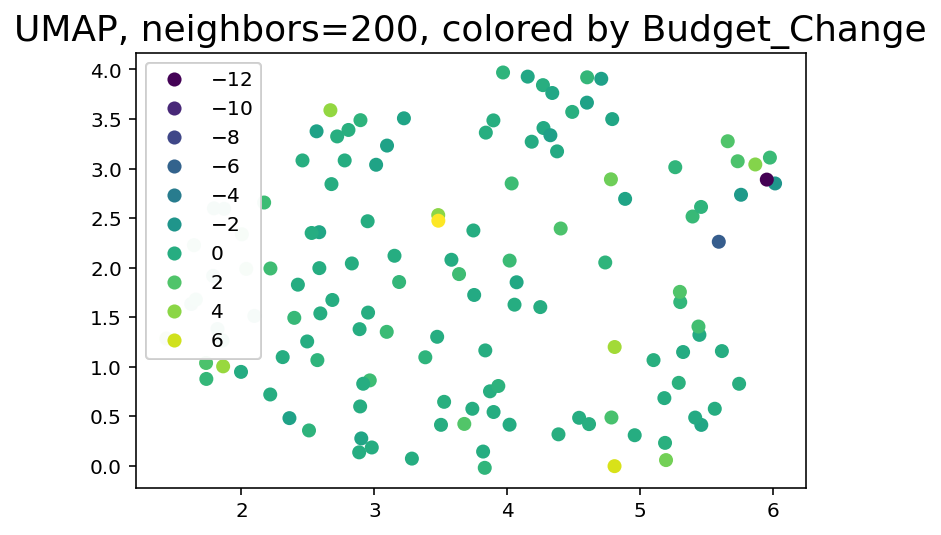

In [31]:
%%time

#remove outliers
for n_neighbor in [2,5,10,20,50,100, 200]:
    filter_cond = dummified['Budget_Change']< 20
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=dummified['Budget_Change'][filter_cond], title = f"UMAP, neighbors={n_neighbor}, colored by {dummified['Budget_Change'].name}")

In [32]:
%%time

#use plotly
for n_neighbor in [5,10,20,50]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Budget_Change'][filter_cond]
    size = scaled_df['Schedule_Change'][filter_cond].abs()# size can't be negative
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})

CPU times: user 3.58 s, sys: 23.4 ms, total: 3.6 s
Wall time: 3.59 s


In [33]:
%%time

for n_neighbor in [5,10, 20, 50]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Schedule_Change'][filter_cond]
    size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
    px
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})

CPU times: user 3.41 s, sys: 4 ms, total: 3.41 s
Wall time: 3.4 s


In [34]:
umap_df.columns[umap_df.columns.str.lower().str.contains("budget")]

Index(['Budget_Start'], dtype='object')

In [35]:
len(umap_df.drop(columns="Budget_Start").loc[filter_cond,:].columns)

62

In [36]:
umap_df.columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Budget_Start', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_

In [37]:
new_cols

{'Borough_Bronx',
 'Borough_Brooklyn',
 'Borough_Brooklyn, Queens',
 'Borough_Citywide',
 'Borough_Manhattan',
 'Borough_Manhattan, Bronx',
 'Borough_Manhattan, Staten Island, Bronx',
 'Borough_Marlboro',
 'Borough_New York',
 'Borough_Olive',
 'Borough_Port Jervis',
 'Borough_Queens',
 'Borough_Staten Island',
 'Borough_Valhalla',
 'Borough_not_specified',
 'Budget_Start',
 'Category_Arts and Culture',
 'Category_Bridges',
 'Category_Bridges, Streets and Roadways',
 'Category_Ferries',
 'Category_Health and Hospitals',
 'Category_Industrial Development',
 'Category_Industrial Development, Parks',
 'Category_Other Government Facilities',
 'Category_Parks',
 'Category_Parks, Streets and Roadways',
 'Category_Public Safety and Criminal Justice',
 'Category_Sanitation',
 'Category_Schools',
 'Category_Sewers',
 'Category_Streets and Roadways',
 'Category_Wastewater Treatment',
 'Category_Water Supply',
 'Client_Agency_BWS',
 'Client_Agency_DCAS',
 'Client_Agency_DCLA',
 'Client_Agency_DEP

In [38]:
umap_df

,Borough_Bronx,Borough_Brooklyn,"Borough_Brooklyn, Queens",Borough_Citywide,Borough_Manhattan,"Borough_Manhattan, Bronx","Borough_Manhattan, Staten Island, Bronx",Borough_Marlboro,Borough_New York,Borough_Olive,...,Managing_Agency_DDC,Managing_Agency_DEP,Managing_Agency_DOT,Managing_Agency_DSNY,Managing_Agency_EDC,Managing_Agency_SCA,Phase_Start_2-Design,Phase_Start_3-Construction Procurement,Phase_Start_4-Construction,Client_Agency_DSBS
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
130,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
131,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


In [39]:
umap_df.drop(columns="Budget_Start").loc[filter_cond,:].columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_Agency_BWS', 'Cl

In [40]:
%%time

#drop the high value ones to visualize better

for n_neighbor in [5,10]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Budget_Change'][filter_cond]
    size = scaled_df['Schedule_Change'][filter_cond].abs()# size can't be negative
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})
                                

CPU times: user 1.51 s, sys: 40 µs, total: 1.51 s
Wall time: 1.5 s


/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/umap/umap_.py:1679: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



CPU times: user 5.17 s, sys: 11.5 ms, total: 5.18 s
Wall time: 5.17 s


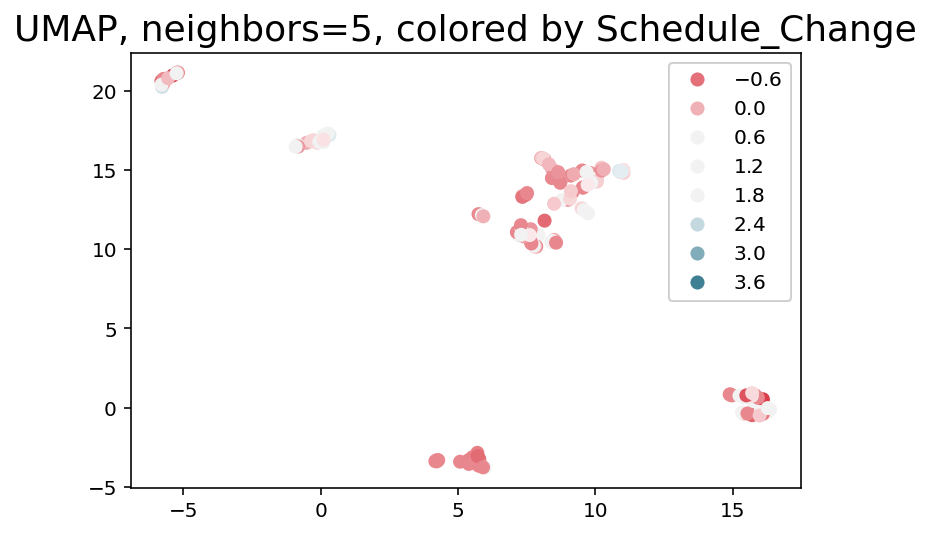

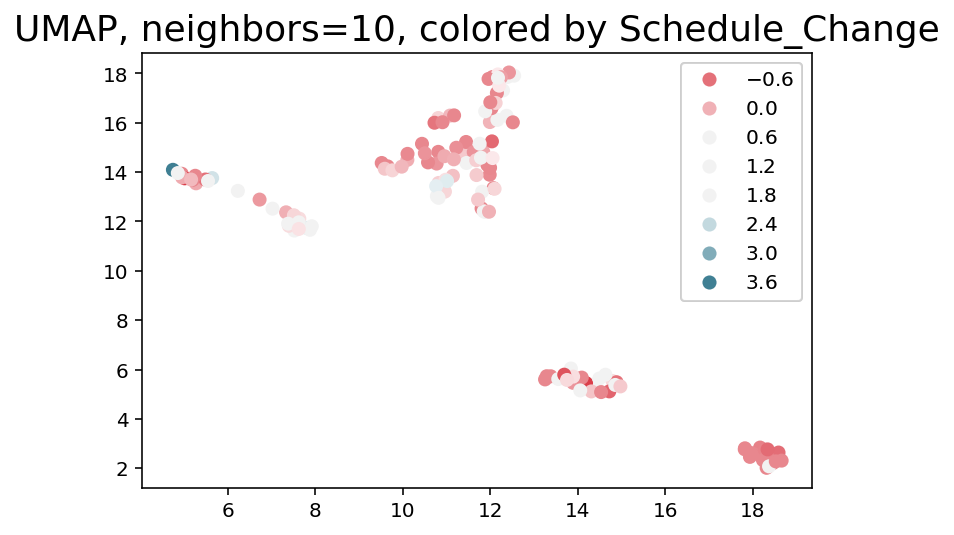

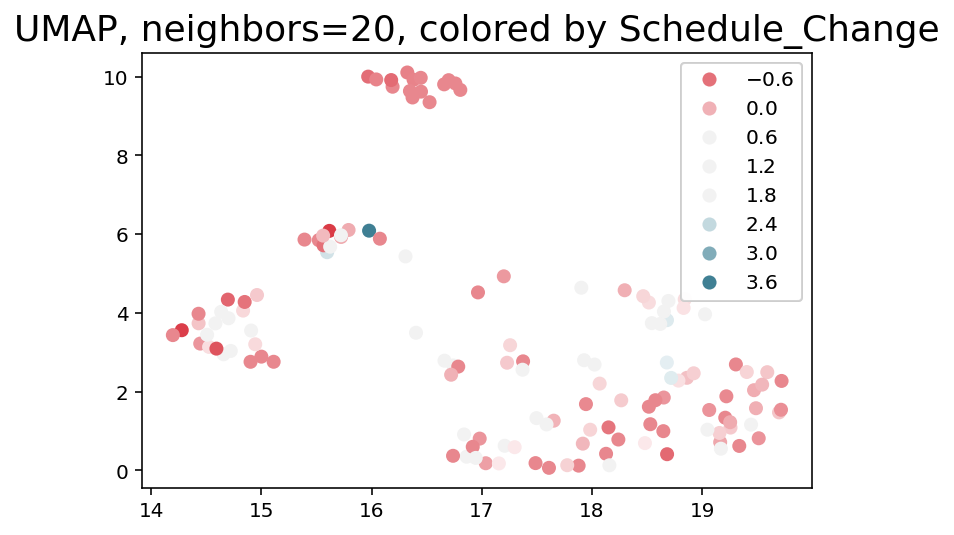

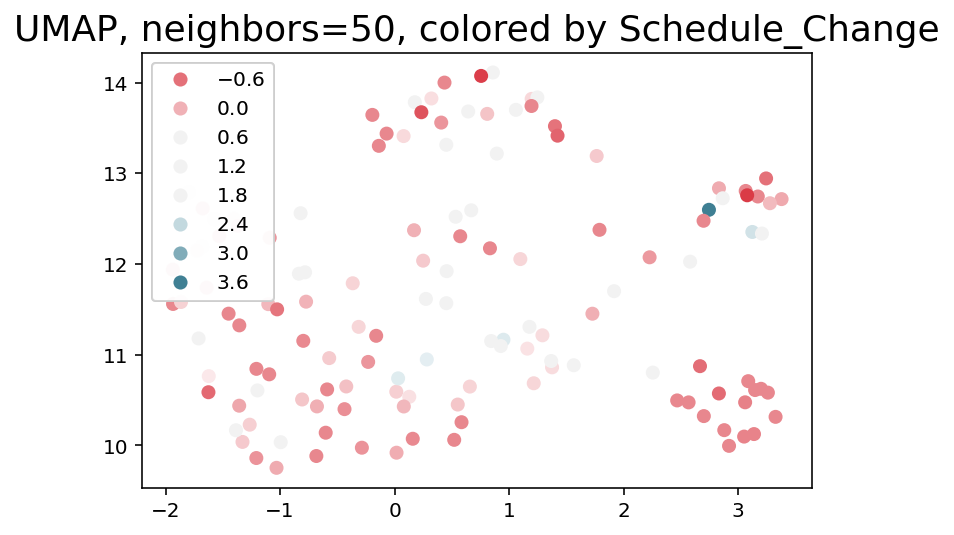

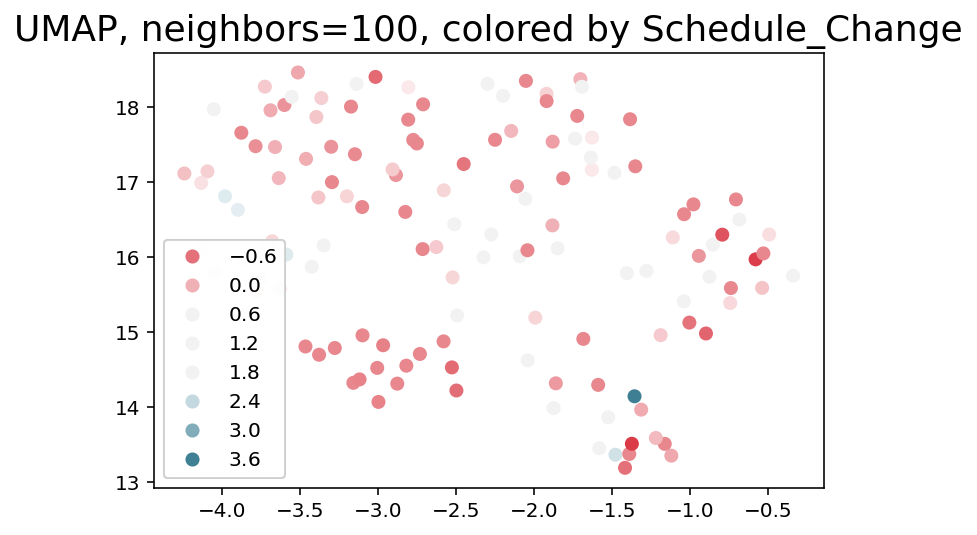

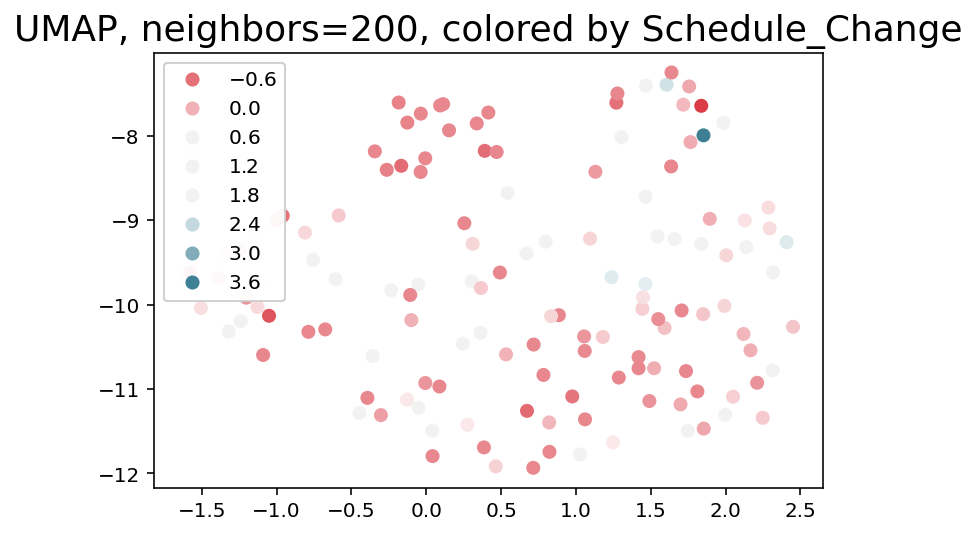

In [41]:
%%time

#switch size and color
for n_neighbor in [5,10,20,50,100, 200]:
    filter_cond = dummified['Budget_Change'].notnull()#< 20
    color = dummified['Schedule_Change'][filter_cond]
    size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
    hover_name = scaled_df["PID"][filter_cond]
    symbol = scaled_df["Category"][filter_cond]
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =False, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})

In [42]:
%%time

for n_neighbor in [5,10,20,50,100, 200]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Schedule_Change'][filter_cond]
    size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
    hover_name = scaled_df["PID"][filter_cond]
    symbol = scaled_df["Category"][filter_cond]
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/umap/umap_.py:1679: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



CPU times: user 5.52 s, sys: 2.03 ms, total: 5.52 s
Wall time: 5.51 s


In [43]:
interesting_group = [812, 673, 813, 680, 817, 815, 816, 866, 864, 868]
df.query("PID in @interesting_group")

,PID,Project_Name,Description,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,...,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv,Category
14,815,Queens Public School @ Parcel F,Design and construction of a new school,Queens,SCA,DOE,4-Construction,2.792665,3,2016-11-15,...,-10852601.0,0.0,-0.118485,0.134410,0.118485,1.0,0.881515,0.0,0.134410,Schools
18,866,Brooklyn Public School 97 Addition,Design and construction of an addition to an e...,not_specified,SCA,DOE,4-Construction,2.083547,3,2017-08-01,...,3423226.0,0.0,0.063739,0.059920,0.063739,1.0,1.063739,0.0,-0.059920,Schools
40,816,Staten Island D75 replacement @ 15 Fairfield N...,Design and construction of a new school,Staten Island,SCA,DOE,4-Construction,2.439475,3,2017-03-24,...,-6089333.0,0.0,-0.119591,0.135835,0.119591,1.0,0.880409,0.0,0.135835,Schools
48,812,Brooklyn Public School 127 Addition,Design and construction of a new school,Brooklyn,SCA,DOE,3-Construction Procurement,2.132830,3,2017-07-14,...,-24805809.0,0.0,-0.274457,0.378278,0.274457,1.0,0.725543,0.0,0.378278,Schools
62,817,Queens Academy of American Studies,Design and construction of a new school,Queens,SCA,DOE,3-Construction Procurement,2.677673,3,2016-12-27,...,-21721218.0,0.0,-0.185380,0.227567,0.185380,1.0,0.814620,0.0,0.227567,Schools
67,673,Queens Public School 419 New Constrcution,Design and construction of a new school,Staten Island,SCA,DOE,3-Construction Procurement,2.288890,3,2017-05-18,...,-17989768.0,0.0,-0.187131,0.230211,0.187131,1.0,0.812869,0.0,0.230211,Schools
74,680,Queens Public School 129 Addition,Design and construction of a new school,Queens,SCA,DOE,3-Construction Procurement,2.579108,3,2017-02-01,...,-9763324.0,0.0,-0.154692,0.183001,0.154692,1.0,0.845308,0.0,0.183001,Schools
90,864,Bronx Public School 97 Addition,Design and construction of an addition to an e...,not_specified,SCA,DOE,4-Construction,2.086285,3,2017-07-31,...,3185749.0,0.0,0.050790,0.048335,0.050790,1.0,1.050790,0.0,-0.048335,Schools
123,813,Brooklyn PS/IS @ 3269 Atlantic Ave New Constru...,Design and construction of a new school,Brooklyn,SCA,DOE,3-Construction Procurement,2.576370,3,2017-02-02,...,-5630761.0,0.0,-0.054820,0.057999,0.054820,1.0,0.945180,0.0,0.057999,Schools
132,868,Queens Public School 256 Annex,Design and construction of a new school,not_specified,SCA,DOE,4-Construction,2.466854,3,2017-03-14,...,-3769531.0,0.0,-0.088788,0.097439,0.088788,1.0,0.911212,0.0,0.097439,Schools


In [44]:
umap_df.columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Budget_Start', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_

In [45]:
filter_cond = dummified['Budget_Change']< 20
color = dummified['Schedule_Change'][filter_cond]
size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
hover_name = scaled_df["PID"][filter_cond]
symbol = scaled_df["Category"][filter_cond]

utils.draw_umap(umap_df.drop(columns=["Budget_Start", "Duration_Start"]).loc[filter_cond,:], n_neighbors=5, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"});

In [46]:
filter_cond = dummified['Budget_Change']< 20
color = dummified['Schedule_Change'][filter_cond]
size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
hover_name = scaled_df["PID"][filter_cond]
symbol = scaled_df["Category"][filter_cond]

utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=5, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"});


## Output embeddings

In [47]:
mapping_df_list =[]
mapper_dict= {}
mapper_dict["attributes"] = {}

for dim in [2,5,10]:
    mapping, mapper = utils.draw_umap(umap_df,n_neighbors=5,n_components=dim, plot=False)
    mapping_df_list.append(pd.DataFrame(mapping, columns=[f"attributes_embedding_{dim}D"]* dim))
    mapper_dict["attributes"][f"{dim}D"] = mapper

In [48]:
final_embedding_df = pd.concat(mapping_df_list, axis=1)
final_embedding_df

,attributes_embedding_2D,attributes_embedding_2D,attributes_embedding_5D,attributes_embedding_5D,attributes_embedding_5D,attributes_embedding_5D,attributes_embedding_5D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D,attributes_embedding_10D
0,7.933322,10.908504,7.569105,-0.560536,0.041148,14.479900,8.635388,8.438684,-0.127522,0.883789,0.474703,5.913608,6.260865,2.145286,5.859844,4.040154,5.398149
1,5.708924,-2.845043,5.965626,1.244426,-5.332561,7.168635,9.971826,9.313766,10.892396,-0.735310,-2.506170,3.637259,1.574966,6.067787,11.044902,7.798994,-0.301501
2,9.109598,14.643936,5.098443,-1.759553,1.507569,15.801831,11.300212,7.670779,-0.881943,0.489166,1.407200,7.270394,7.549972,3.081996,6.411722,3.942510,6.605800
3,-5.773407,20.231695,0.860131,2.794261,3.114838,6.974932,3.997319,2.148678,1.484134,0.963524,4.592977,3.778627,2.743726,4.679740,8.081909,5.598413,4.902291
4,9.910598,14.535109,4.567799,-2.070188,2.061721,15.687389,11.590457,7.672594,-0.426021,0.601930,0.959431,7.452657,7.963828,3.040017,6.425090,3.952270,6.895366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,10.313980,15.038584,4.323989,-1.626424,1.879304,15.389887,11.448050,7.615074,-0.294666,0.727784,1.126823,7.320976,7.591668,2.844715,6.845970,4.221854,6.486233
130,-5.245070,21.090260,0.296019,2.904007,2.628390,7.012816,4.741239,2.443961,1.356686,1.095339,4.319624,4.157038,2.625397,4.343608,7.582565,5.715786,4.642244
131,7.517490,13.539482,6.478183,-1.113075,0.526405,15.325090,9.873224,8.130541,-0.940734,0.530468,1.465247,6.448269,6.504492,2.690318,6.081278,4.066692,5.526755
132,4.227178,-3.386102,7.254211,0.973053,-5.767452,7.027475,9.853369,8.878852,10.075530,-1.242272,-3.090428,4.222354,2.408109,5.245953,11.492887,7.064980,0.626882


In [49]:
# dump(mapper_dict, open("../data/interim/attributes_UMAP_all_mappers.pkl", "wb"))

# Clustering

[Return to top](#Notebook-contents)

## Create different embeddings to visualize the clustering on

In [50]:
viz_embedding_5, mapper = utils.draw_umap(umap_df, plot=False, n_neighbors=5, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})
viz_embedding_10, mapper = utils.draw_umap(umap_df, plot=False, n_neighbors=10, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})
viz_embedding_20, mapper = utils.draw_umap(umap_df, plot=False, n_neighbors=20, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})

## Clustering on the raw data

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 35 clusters
fraction clustered: 0.746268656716418


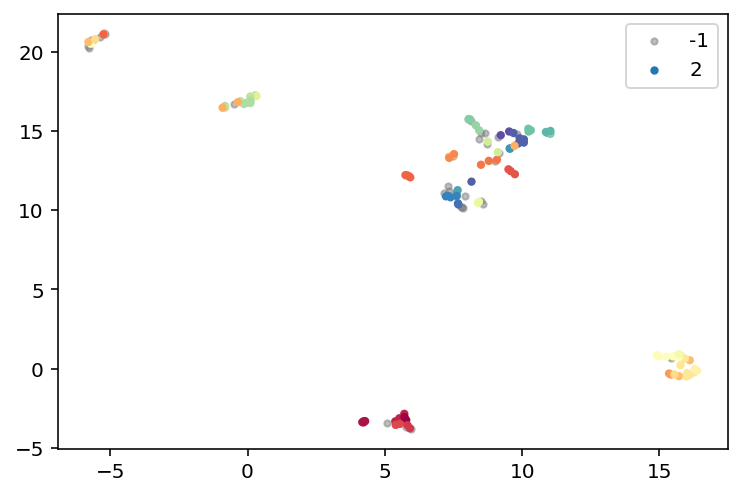

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


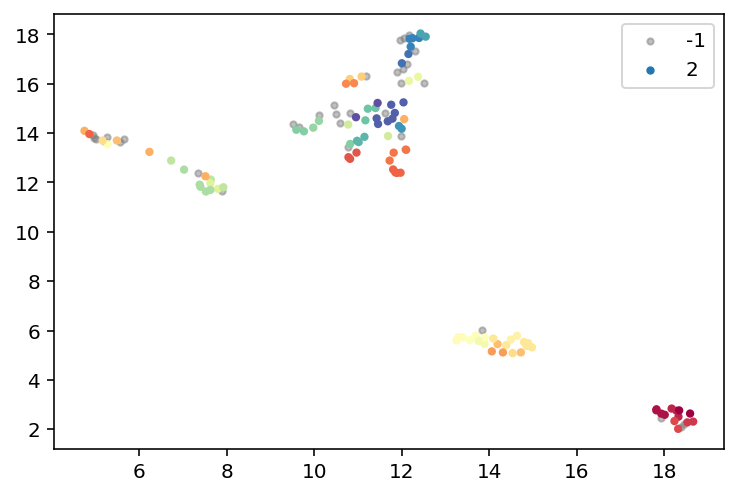

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


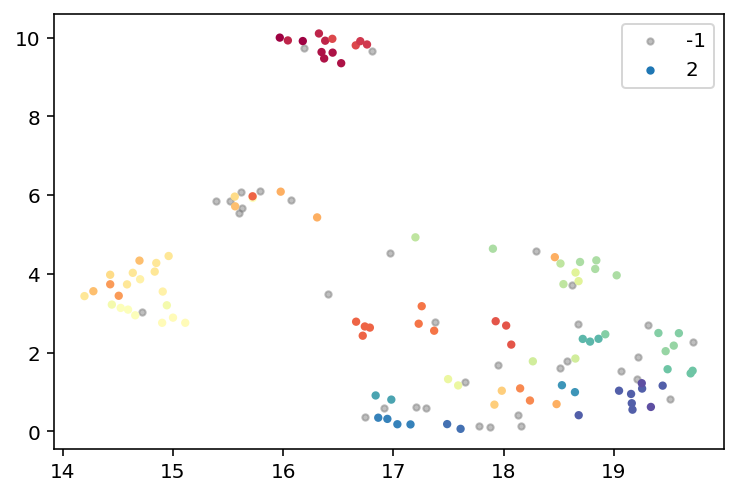

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 3 clusters
fraction clustered: 0.8731343283582089


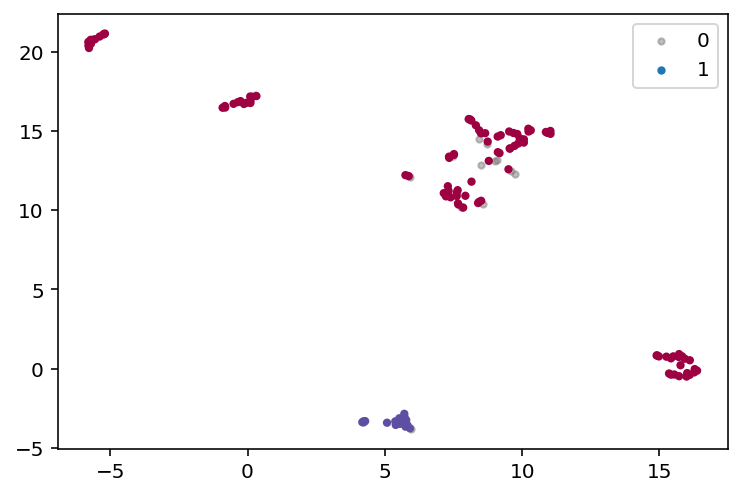

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


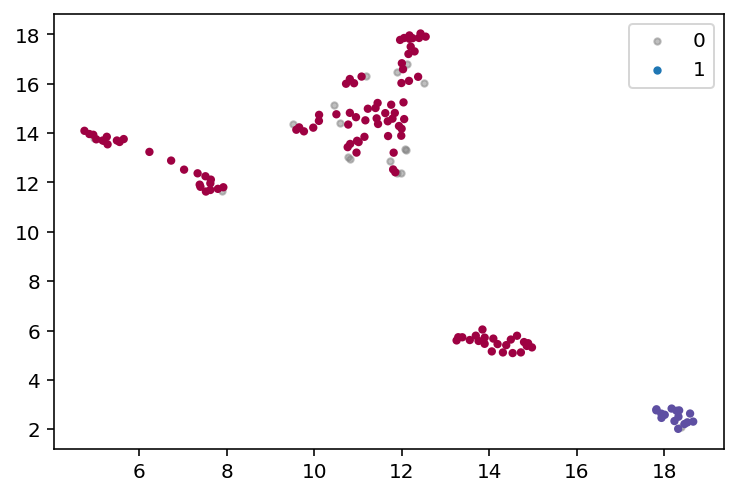

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


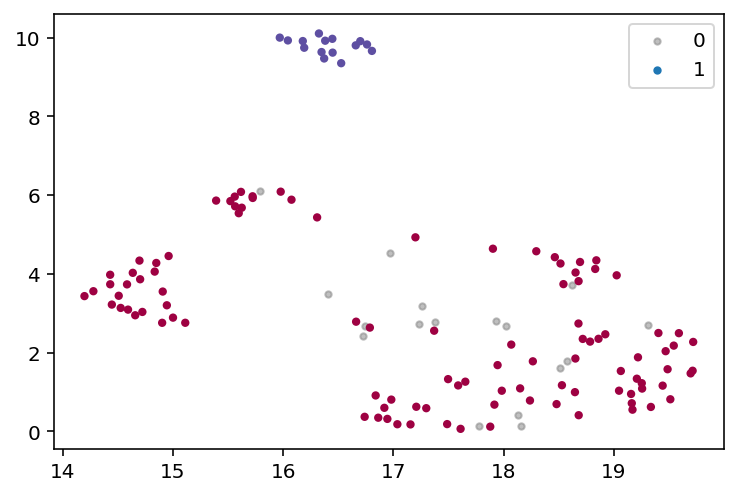

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 3 clusters
fraction clustered: 0.7985074626865671


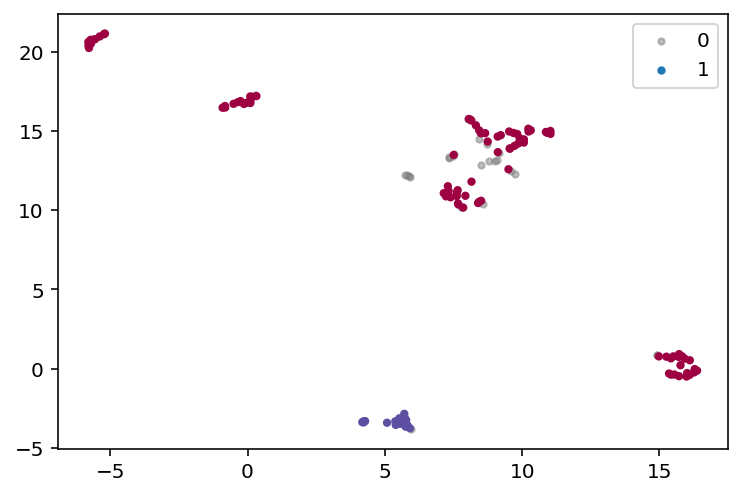

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


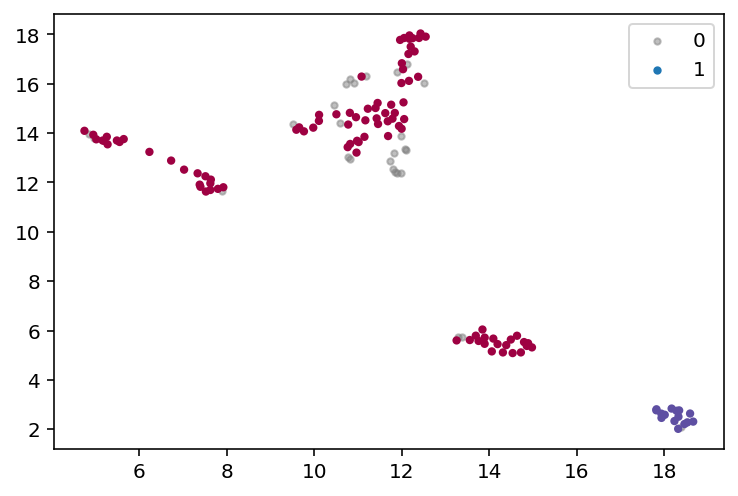

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


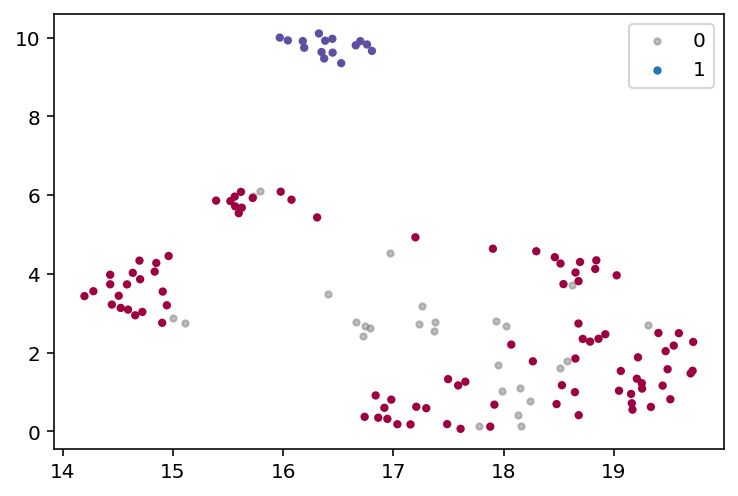

---------------
CPU times: user 1.53 s, sys: 23.8 ms, total: 1.55 s
Wall time: 1.54 s


In [51]:
%%time

for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(umap_df.drop(columns="Budget_Start"), min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

## Clustering on output of UMAP 5 neighbors

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 21 clusters
fraction clustered: 0.9253731343283582


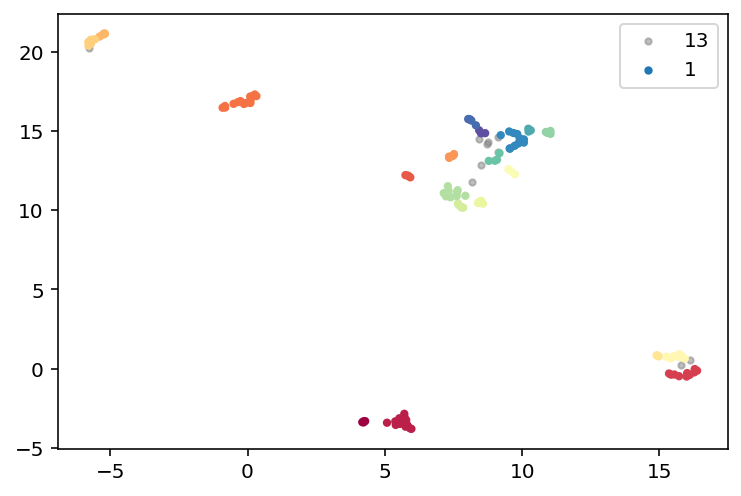

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


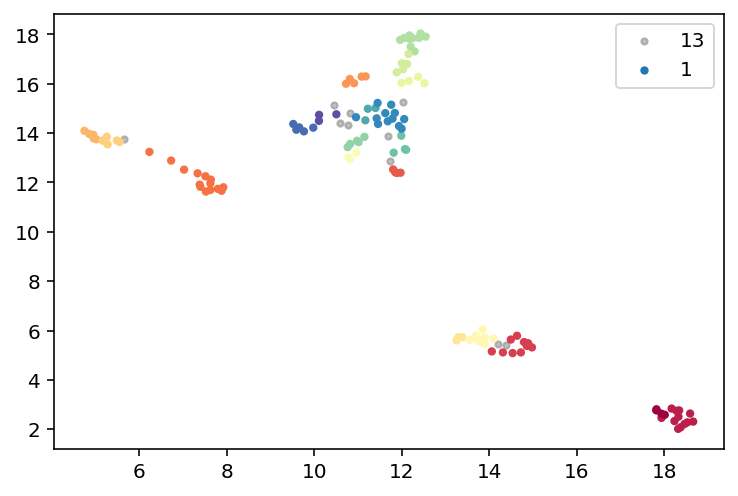

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


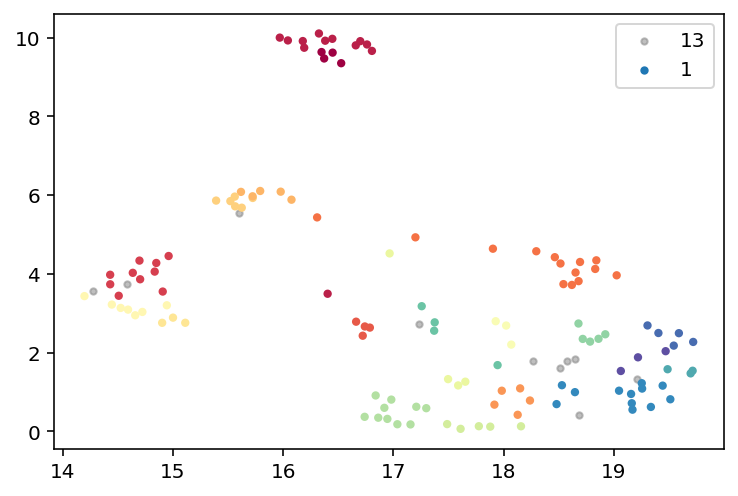

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 5 clusters
fraction clustered: 1.0


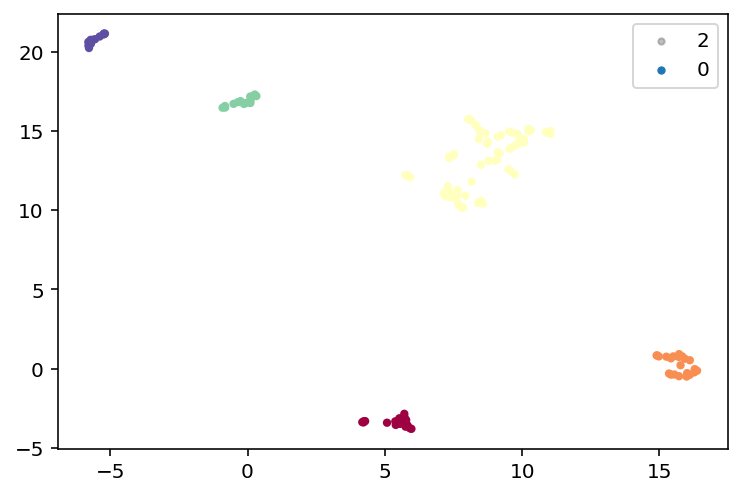

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


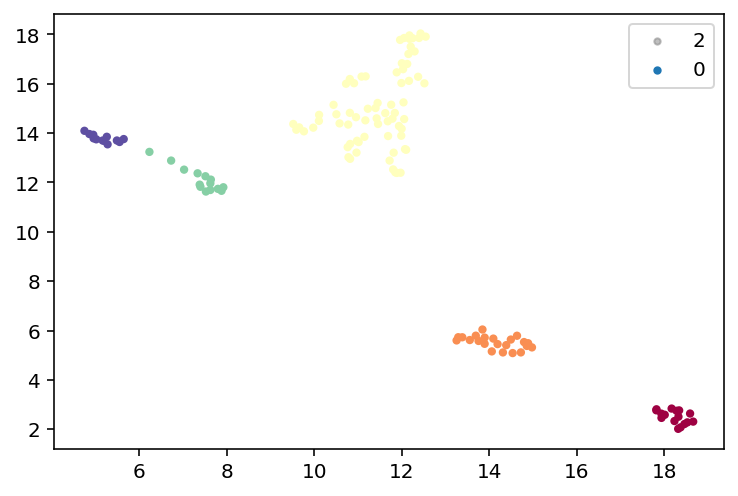

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


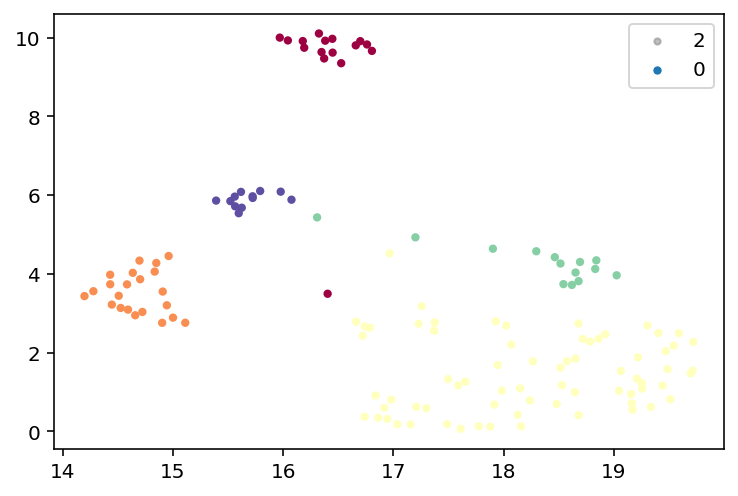

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 5 clusters
fraction clustered: 1.0


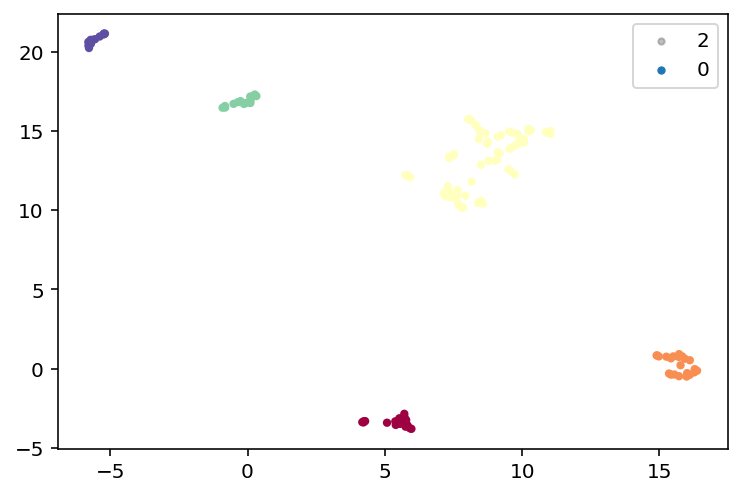

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


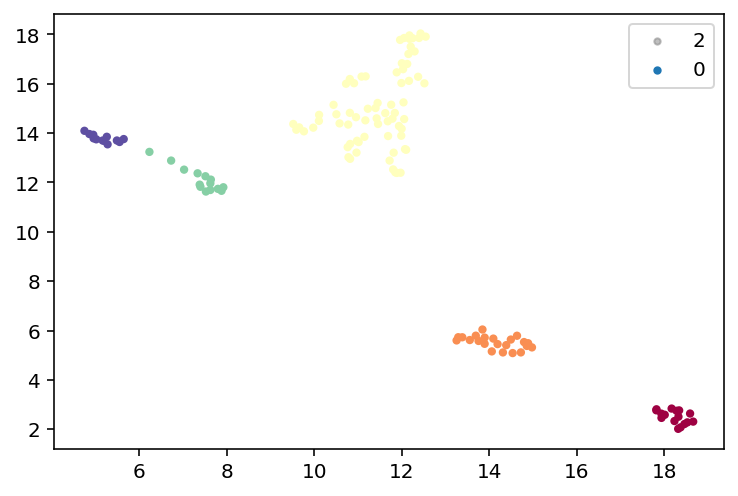

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


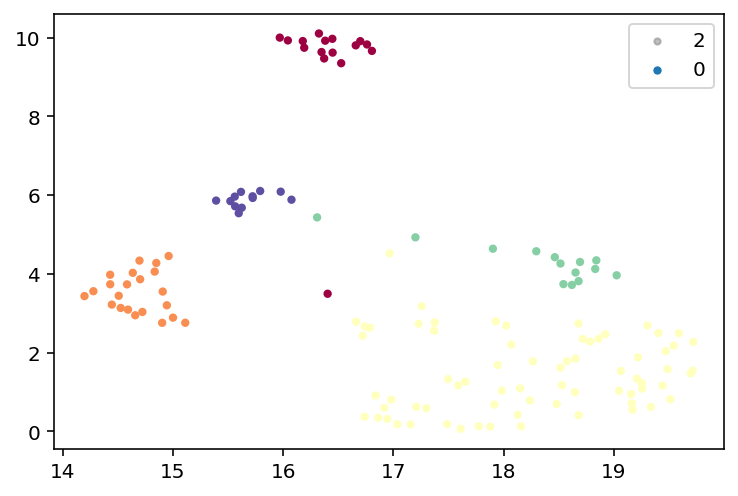

---------------
CPU times: user 1.43 s, sys: 32.7 ms, total: 1.46 s
Wall time: 1.44 s


In [52]:
%%time

for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(viz_embedding_5, min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

## Clustering on UMAP output 10 neighbors

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 16 clusters
fraction clustered: 0.9701492537313433


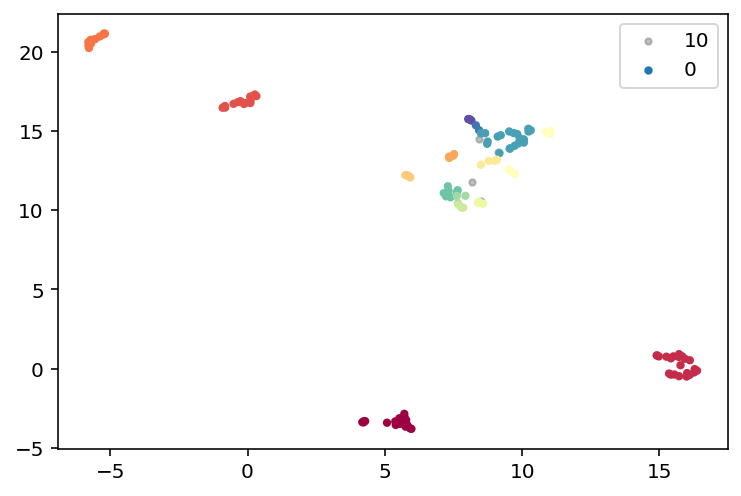

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


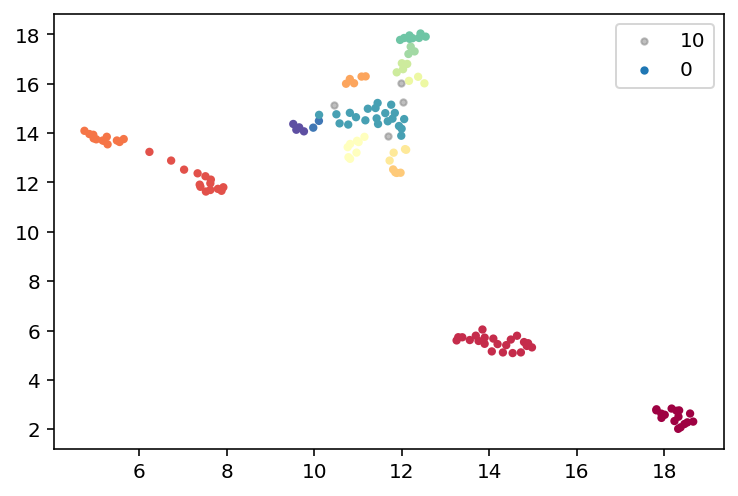

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


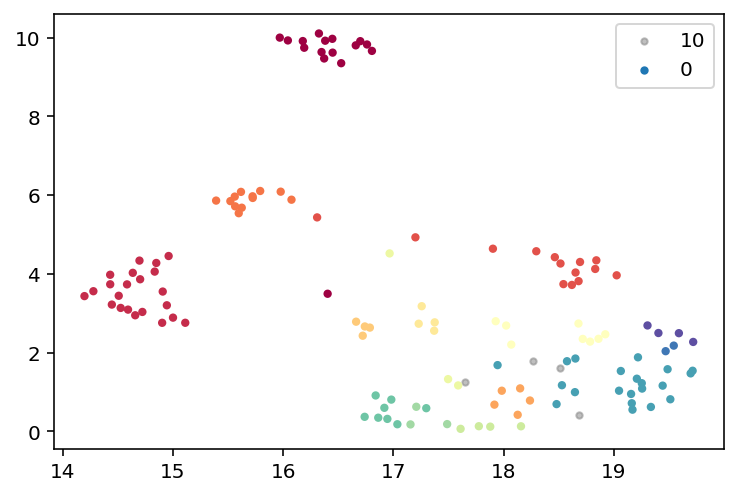

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 6 clusters
fraction clustered: 0.9925373134328358


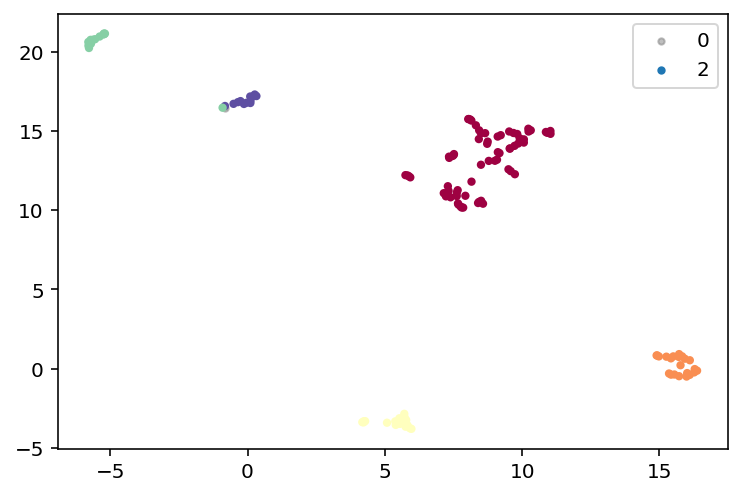

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


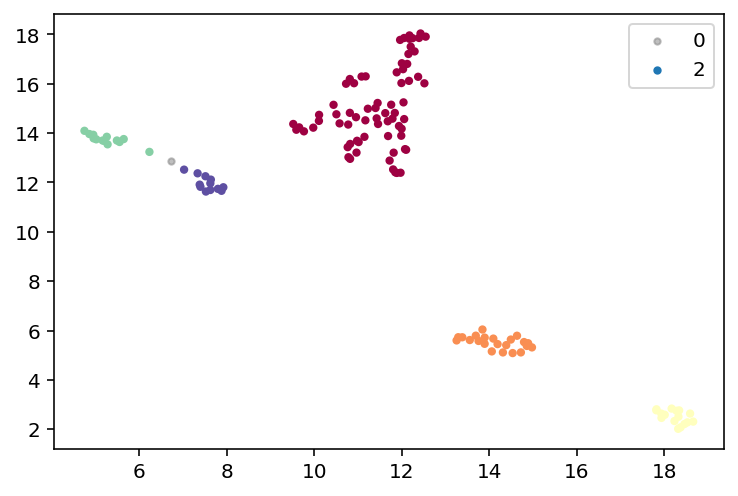

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


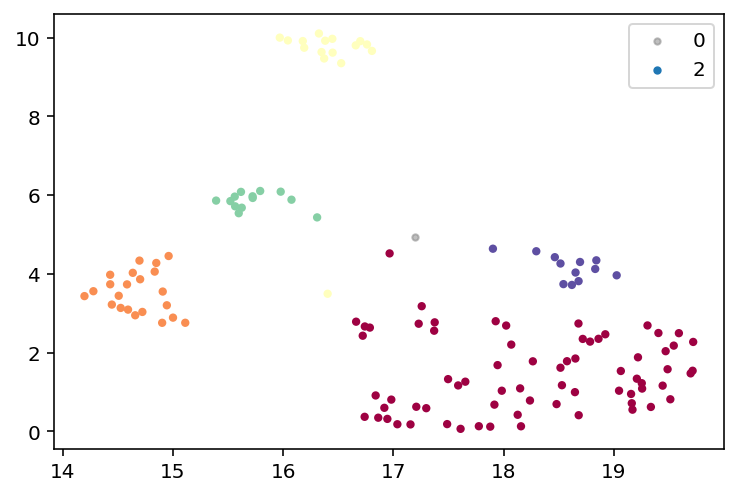

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 6 clusters
fraction clustered: 0.9925373134328358


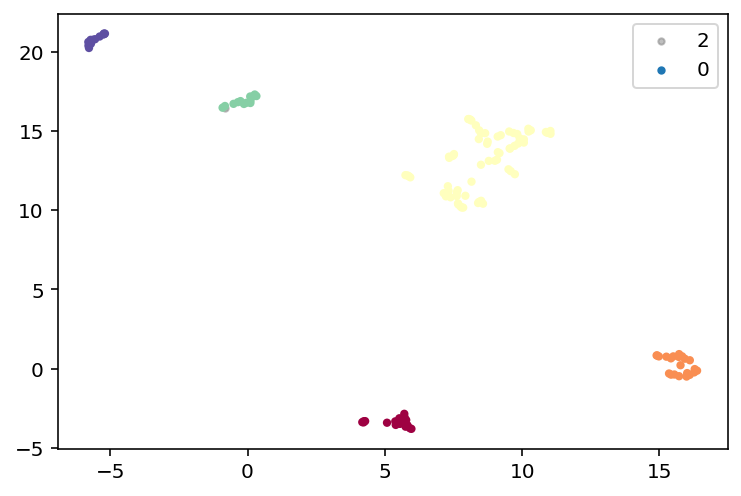

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


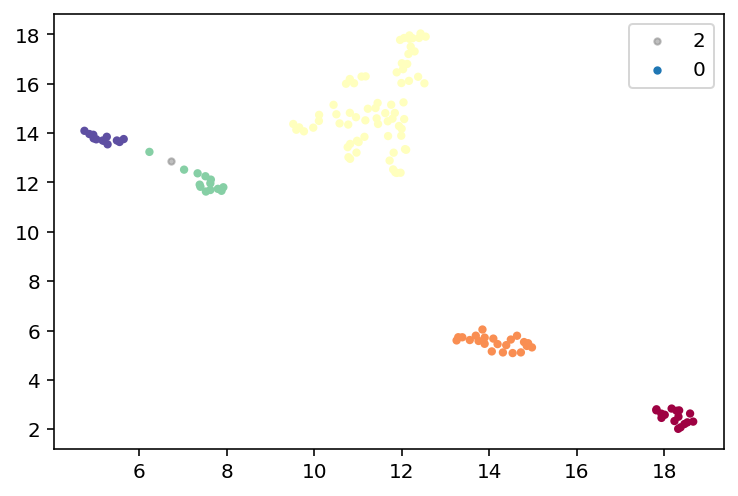

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


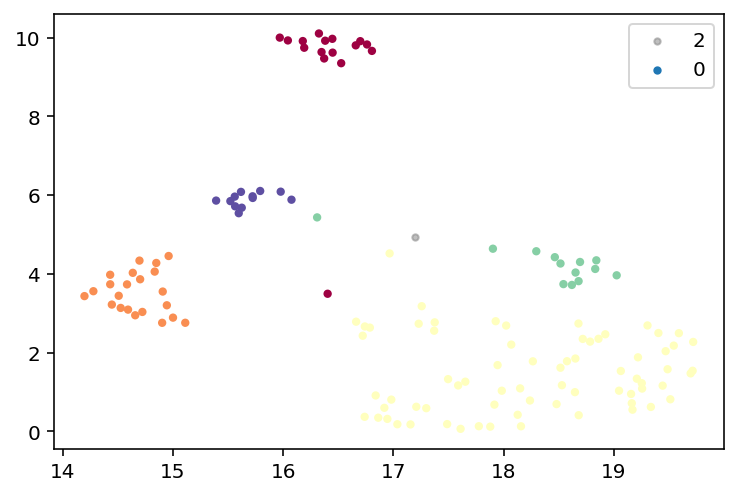

---------------
CPU times: user 1.45 s, sys: 44.6 ms, total: 1.49 s
Wall time: 1.47 s


In [53]:
%%time

for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(viz_embedding_10, min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

## Final clustering

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


min_cluster size: 5
found 5 clusters
fraction clustered: 1.0


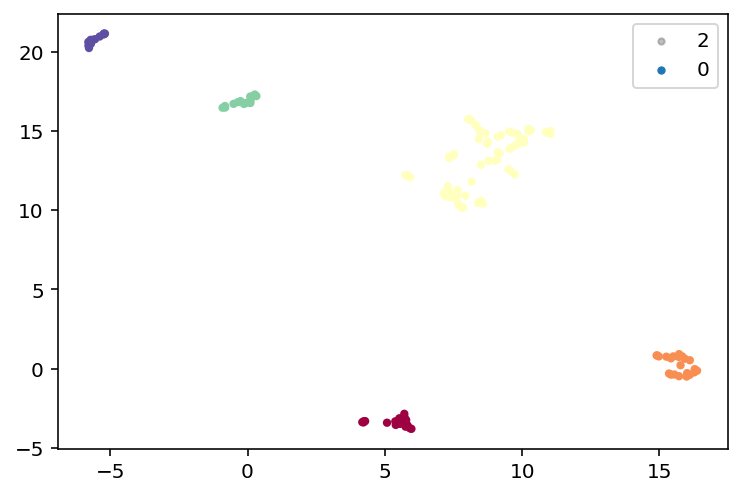

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


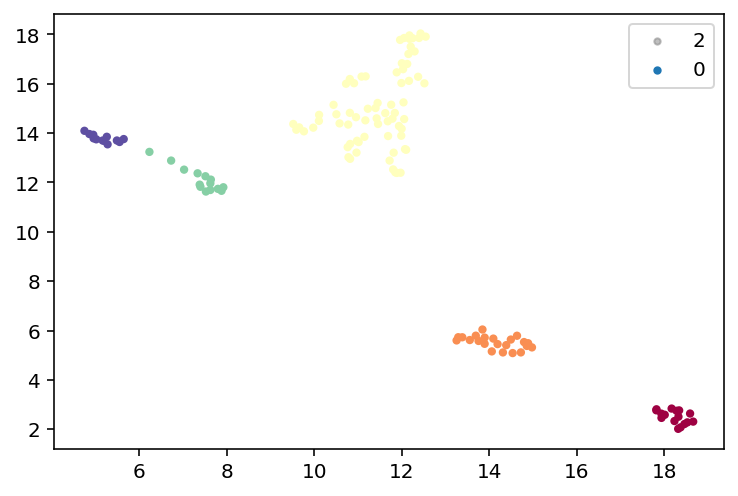

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


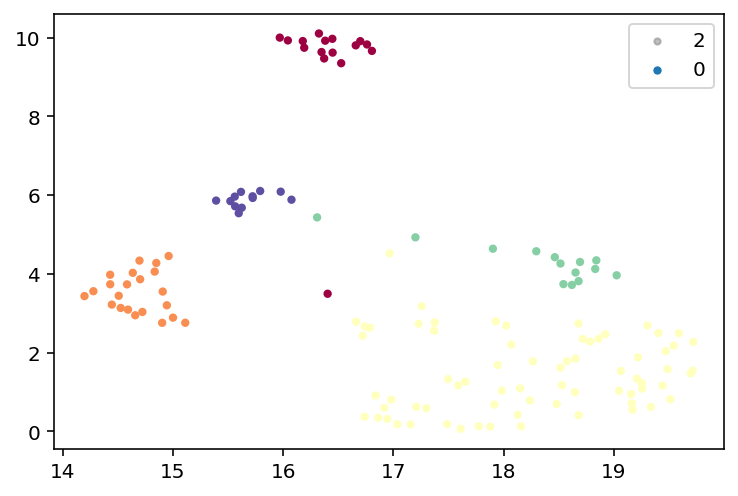

In [54]:
labels, clusterer= utils.cluster_hdbscan(viz_embedding_5, 5, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])

---

# Find clusters' characteristics

[Return to top](#Notebook-contents)

In [55]:
clustering_X = umap_df.loc[labels[labels!= -1],:]
clustering_X["label"] = labels[labels!= -1]

In [56]:
#long output and will crash your notebook

#min_size5_dict = utils.get_cluster_defining_features(umap_df.loc[labels[labels!= -1],:], labels[labels!= -1], "min_cluster_size5") 

In [57]:
clustering_X.groupby("label").mean()

,Borough_Bronx,Borough_Brooklyn,"Borough_Brooklyn, Queens",Borough_Citywide,Borough_Manhattan,"Borough_Manhattan, Bronx","Borough_Manhattan, Staten Island, Bronx",Borough_Marlboro,Borough_New York,Borough_Olive,...,Managing_Agency_DDC,Managing_Agency_DEP,Managing_Agency_DOT,Managing_Agency_DSNY,Managing_Agency_EDC,Managing_Agency_SCA,Phase_Start_2-Design,Phase_Start_3-Construction Procurement,Phase_Start_4-Construction,Client_Agency_DSBS
label,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


In [58]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(clustering_X.groupby("label").mean().var().sort_values(ascending=False))

Budget_Start                                   8.430539
Category_Sewers                                0.300000
Client_Agency_DEP                              0.300000
Managing_Agency_DDC                            0.300000
Duration_Start                                 0.205543
Borough_Bronx                                  0.200000
Category_Schools                               0.200000
Category_Streets and Roadways                  0.200000
Client_Agency_DOE                              0.200000
Client_Agency_DOT                              0.200000
Borough_Staten Island                          0.200000
Borough_Queens                                 0.200000
Phase_Start_3-Construction Procurement         0.200000
Managing_Agency_SCA                            0.200000
Managing_Agency_EDC                            0.200000
Borough_Citywide                               0.200000
Borough_not_specified                          0.200000
Phase_Start_2-Design                           0

In [59]:
#min_size5_dict.keys()

In [60]:
#min_size5_dict['combined_cluster_info_mean_peaks_per_cluster']

In [61]:
#min_size5_dict[0].keys()

In [62]:
#min_size5_dict[0]["AUC_fig"]

In [63]:
cluster_features = list(clustering_X.groupby("label").mean().var()[clustering_X.groupby("label").mean().var() != 0].index)
cluster_features

['Borough_Bronx',
 'Borough_Citywide',
 'Borough_Queens',
 'Borough_Staten Island',
 'Borough_not_specified',
 'Budget_Start',
 'Category_Schools',
 'Category_Sewers',
 'Category_Streets and Roadways',
 'Client_Agency_DEP',
 'Client_Agency_DOE',
 'Client_Agency_DOT',
 'Duration_Start',
 'Managing_Agency_DDC',
 'Managing_Agency_EDC',
 'Managing_Agency_SCA',
 'Phase_Start_2-Design',
 'Phase_Start_3-Construction Procurement']

In [64]:
radar_plots_df = clustering_X[cluster_features + ["label"]].groupby("label").mean().reset_index().rename(columns={"label":"group"})
radar_plots_df

,group,Borough_Bronx,Borough_Citywide,Borough_Queens,Borough_Staten Island,Borough_not_specified,Budget_Start,Category_Schools,Category_Sewers,Category_Streets and Roadways,Client_Agency_DEP,Client_Agency_DOE,Client_Agency_DOT,Duration_Start,Managing_Agency_DDC,Managing_Agency_EDC,Managing_Agency_SCA,Phase_Start_2-Design,Phase_Start_3-Construction Procurement
0,0,0,0,1,0,0,-0.407632,0,0,1,0,0,1,0.234742,1,0,0,1,0
1,1,1,0,0,0,0,0.249054,1,0,0,0,1,0,-0.553991,0,0,1,1,0
2,2,0,0,0,1,0,-0.270712,0,1,0,1,0,0,0.124748,1,0,0,0,1
3,3,0,1,0,0,0,6.283543,0,1,0,1,0,0,-0.697518,0,1,0,1,0
4,4,0,0,0,0,1,-0.306266,0,1,0,1,0,0,0.219987,1,0,0,1,0


In [65]:
test = clustering_X.copy()
test[budget_cols + ["Budget_Start"] + schedule_cols + ["Schedule_End"]] = scaled_df[budget_cols + ["Budget_Start"] + schedule_cols + ["Schedule_End"]]
test

dump(test, open("../models/clustering_X.pickle", "wb"))

In [66]:
test = clustering_X.copy()
test[budget_cols + ["Budget_Start"] + schedule_cols + ["Schedule_End"]] = scaled_df[budget_cols + ["Budget_Start"] + schedule_cols + ["Schedule_End"]]

test = test.melt(id_vars = test.columns.difference(budget_cols + ["Budget_Start"]), value_vars = budget_cols + ["Budget_Start"], var_name = "Budget_metric", value_name="Budget_metric_value")
test = test.melt(id_vars = test.columns.difference(schedule_cols + ["Schedule_End"]), value_vars = schedule_cols + ["Schedule_End"], var_name = "Schedule_metric", value_name= "Schedule_metric_value")

In [67]:
px.histogram(test,x="Budget_metric_value",color = "label", facet_row = "Budget_metric", height=2000)

In [68]:
px.histogram(test,x="Schedule_metric_value",color = "label", facet_row = "Schedule_metric", height=2000)

In [69]:
clustering_X.label.value_counts()

2    70
1    22
0    16
3    14
4    12
Name: label, dtype: int64

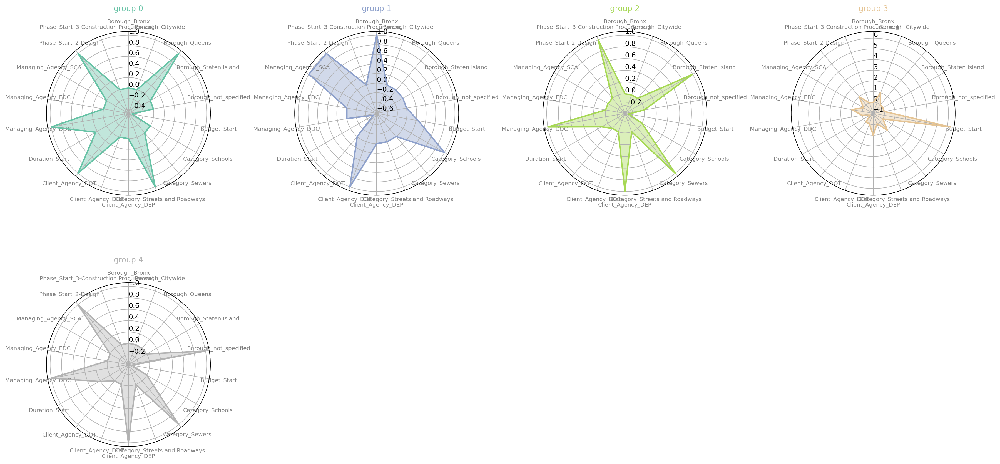

In [70]:
def make_spider(mean_peaks_per_cluster, row, title, color):
    # number of variable
    categories=list(mean_peaks_per_cluster)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(4,4,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    #plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
    #plt.ylim(0,40)

    # Ind1
    scaled = mean_peaks_per_cluster.loc[row].drop('group').values
    values=mean_peaks_per_cluster.loc[row].drop('group').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=11, color=color, y=1.1)

    
# ------- PART 2: Apply to all individuals
# initialize the figure
my_dpi=50
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi + 40)

# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(radar_plots_df.index))

# Loop to plot
for row in range(0, len(radar_plots_df.index)):
    make_spider( radar_plots_df, row=row, title='group '+radar_plots_df['group'][row].astype("str"), color=my_palette(row))
    
plt.tight_layout()

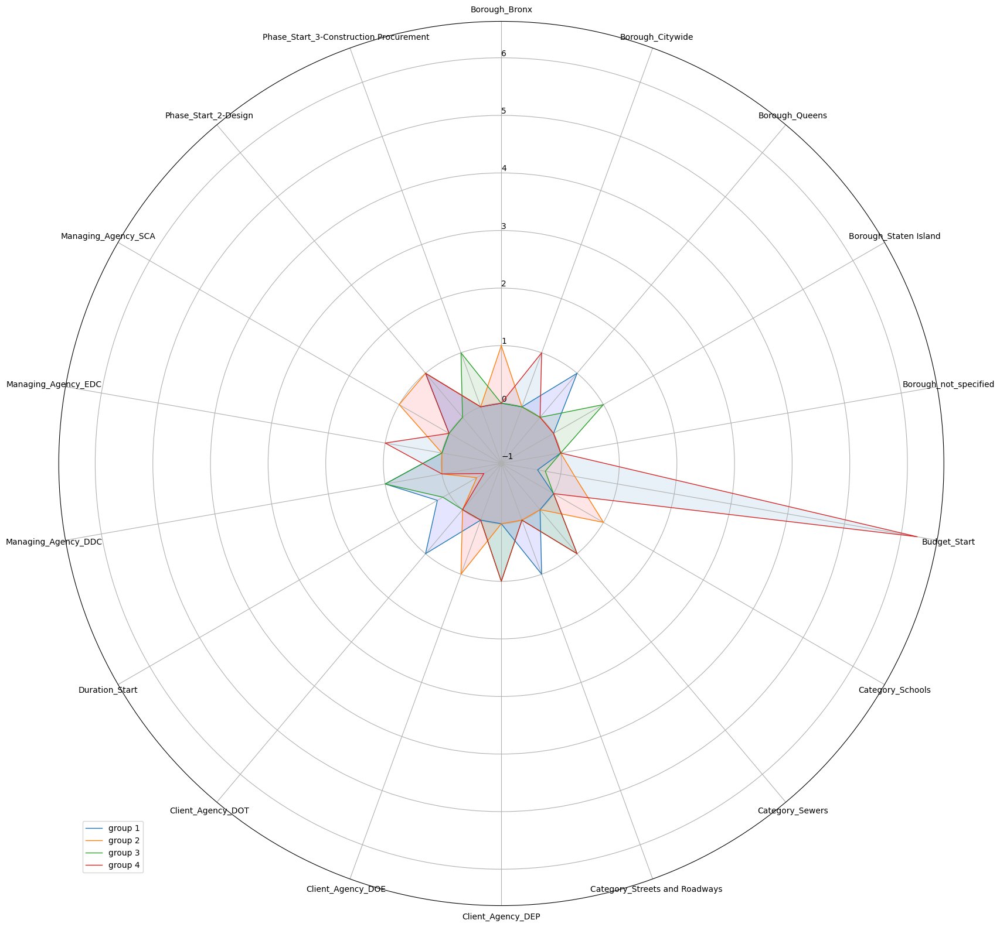

In [71]:
# ------- PART 1: Create background
 
# number of variable
categories=list(radar_plots_df)[1:]
N = len(categories)
 
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)
# Initialise the spider plot
ax = plt.subplot(111, polar=True)
 
# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
 
# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], categories)
 
# Draw ylabels
ax.set_rlabel_position(0)
#plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
#plt.ylim(0,40)
 
 
# ------- PART 2: Add plots
 
# Plot each individual = each line of the data
# I don't do a loop, because plotting more than 3 groups makes the chart unreadable

# Ind1
values=radar_plots_df.loc[0].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 1")
ax.fill(angles, values, 'b', alpha=0.1)
 
# Ind2
values=radar_plots_df.loc[1].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 2")
ax.fill(angles, values, 'r', alpha=0.1)

# Ind3
values=radar_plots_df.loc[2].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 3")
ax.fill(angles, values, 'g', alpha=0.1)

# Ind3
values=radar_plots_df.loc[3].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 4")
ax.fill(angles, values, 'o', alpha=0.1)
 
# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

### Output clustering label

In [72]:
np.unique(labels)

array([0, 1, 2, 3, 4])

In [73]:
final_embedding_df["clustering_label"] = labels

In [74]:
final_embedding_df.shape

(134, 18)

---

# Clustering embeddings

[Return to top](#Notebook-contents)

In [75]:
final_embedding_df["PID"] = df["PID"]

In [76]:
final_embedding_df = final_embedding_df.merge(embedding, on="PID", how="left")

In [77]:
final_embedding_df.isnull().sum().sum()

0

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.



CPU times: user 12.9 s, sys: 375 ms, total: 13.2 s
Wall time: 12.5 s


/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.



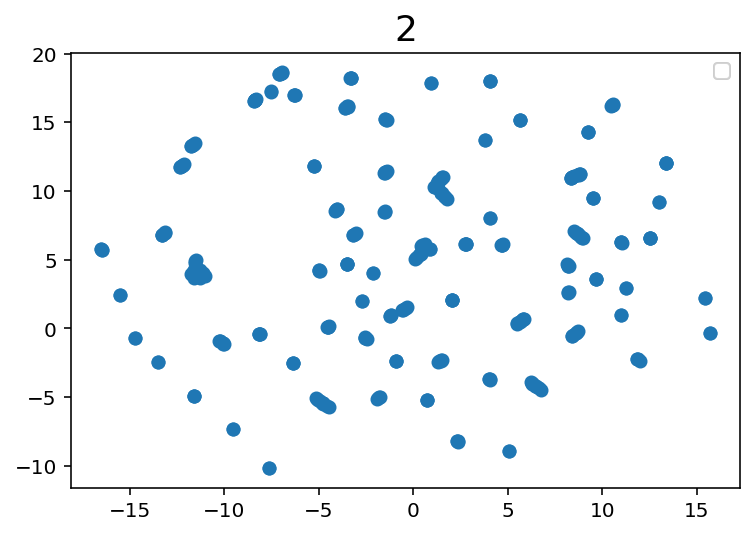

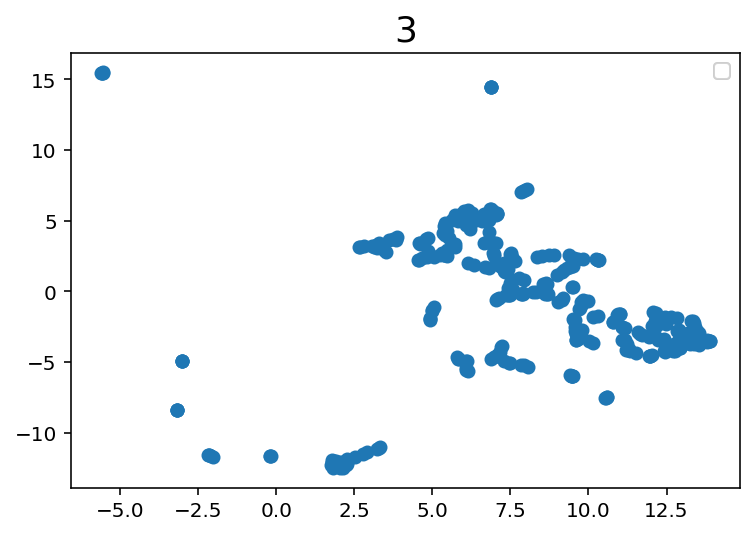

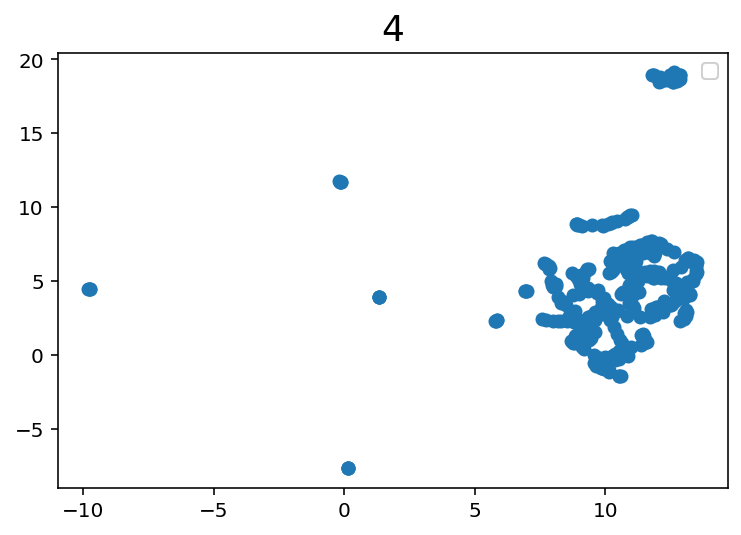

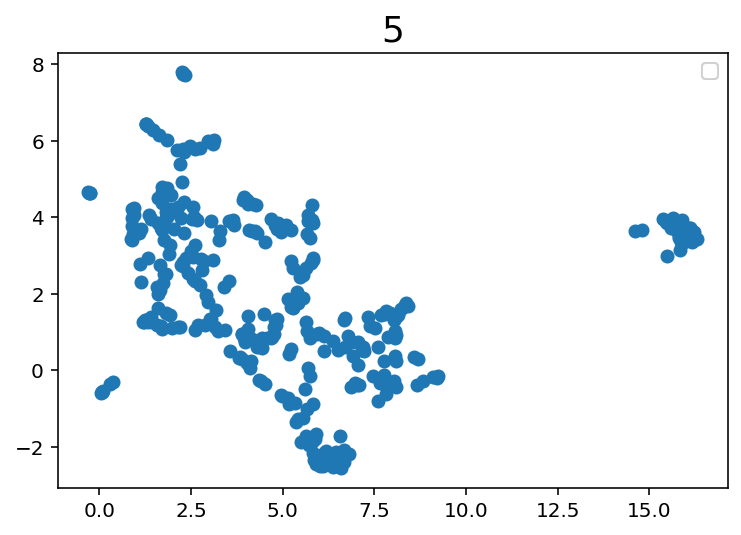

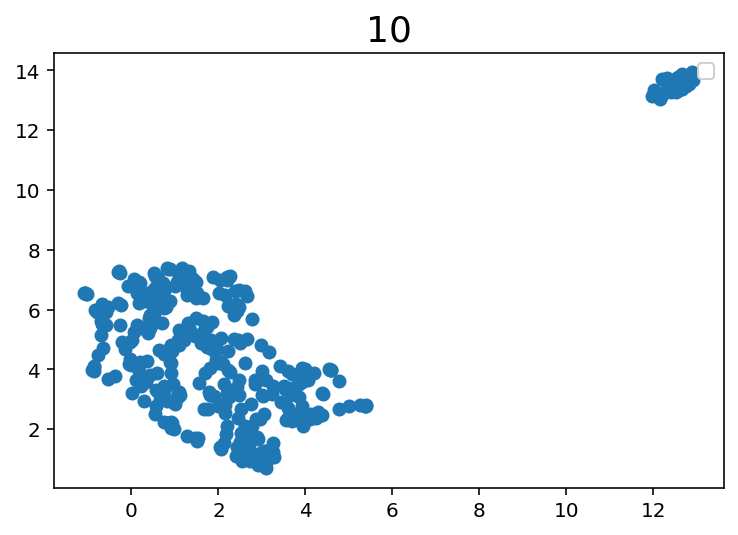

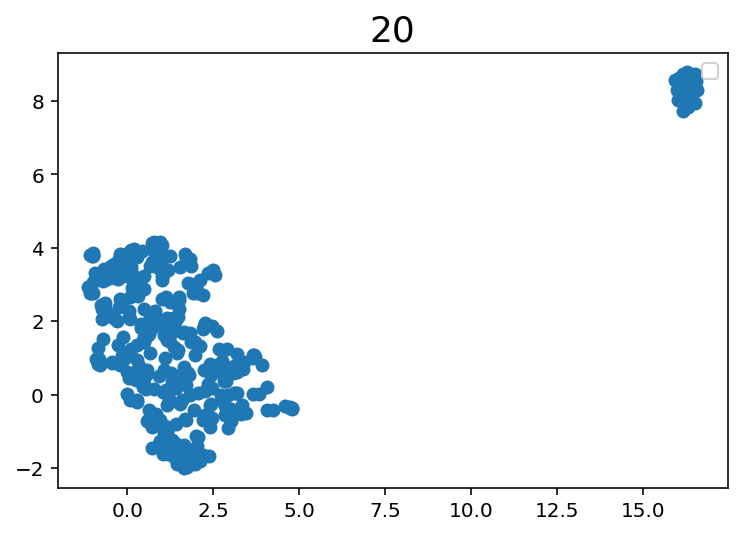

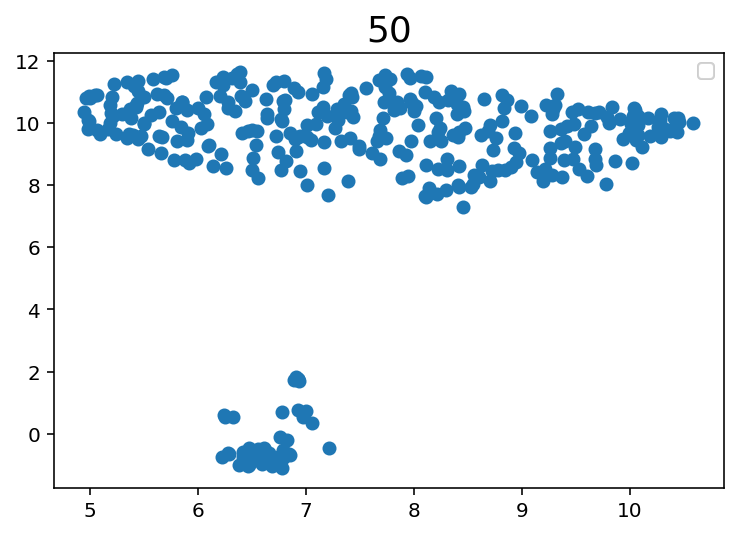

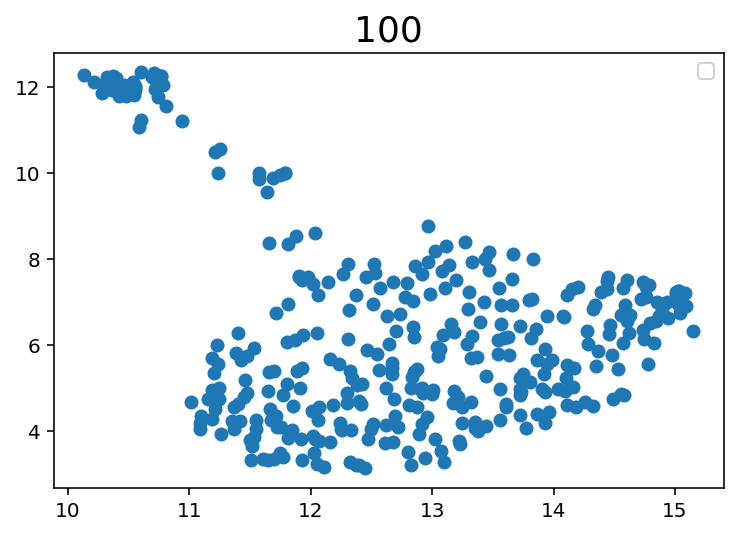

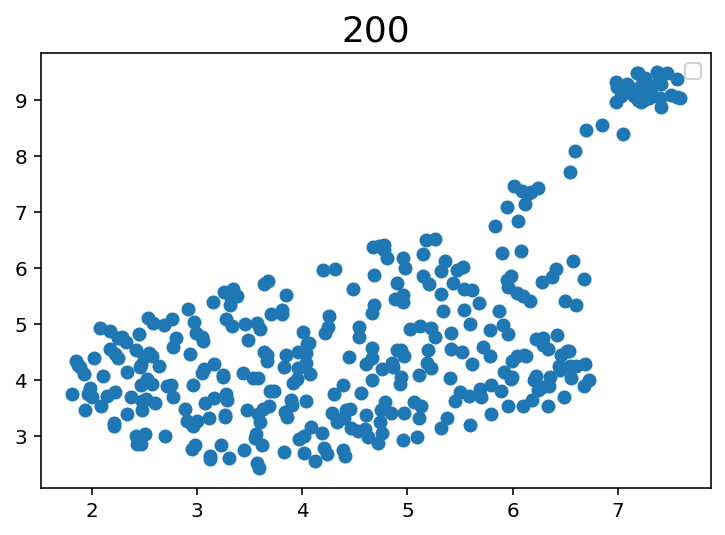

In [78]:
%%time

for n_neighbor in [2,3, 4, 5,10,20,50,100, 200]:
    utils.draw_umap(embedding.drop(columns = ["PID", "embedding"]), n_neighbors=n_neighbor, title=f"{n_neighbor}")

In [79]:
project_info = embedding.merge(data_dict['Capital_Projects_pid'], on="PID", how="left")
project_info

,PID,embedding,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,...,Original_Duration,Budget_Change_Ratio,Schedule_Change_Ratio,Budget_To_Date,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Mark_Metric,Budget_Ratios,Project_Years,Project_Year
0,3,"-0.13854653, 1.4585932, -6.7886453, 0.06109361...",-0.13854653,1.4585932,-6.7886453,0.061093614,0.7148117,0.43594462,-0.23744068,0.3534081,...,2303.0,-0.023357,0.117238,1.805777e+08,0.023916,0.023357,0.023916,0.976643,5.938520,6
1,7,"-0.13127574, 1.1954153, -6.7207437, 0.06122951...",-0.13127574,1.1954153,-6.7207437,0.06122951,0.80961025,0.44387937,-0.09895813,0.39786565,...,1795.0,0.286121,0.381616,6.879846e+07,0.222468,0.286121,-0.222468,1.286121,6.335517,7
2,18,"0.09863796, 1.6704285, -6.5727553, 0.06882739,...",0.09863796,1.6704285,-6.5727553,0.06882739,0.77206296,0.55682564,-0.441742,0.90105414,...,5031.0,0.018842,0.201550,6.787161e+07,0.018493,0.018842,-0.018493,1.018842,16.027708,17
3,25,"-0.26632923, 1.1822444, -6.7360897, 0.06842376...",-0.26632923,1.1822444,-6.7360897,0.06842376,0.6305313,0.452769,-0.35671887,0.54343706,...,4660.0,0.127354,0.423605,2.233672e+08,0.112967,0.127354,-0.112967,1.127354,17.831988,18
4,34,"-0.35451388, 1.6325428, -6.692406, 0.10146355,...",-0.35451388,1.6325428,-6.692406,0.10146355,0.7334988,0.3255136,-0.4081904,0.46820372,...,6635.0,-0.031550,0.302788,4.491583e+08,0.032578,0.031550,0.032578,0.968450,23.335181,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,1010,"-0.52122164, 0.79554, -6.5958495, -0.081063874...",-0.52122164,0.79554,-6.5958495,-0.081063874,0.77371645,0.26616392,0.21820915,0.82970876,...,1742.0,0.000000,0.000000,2.942700e+07,0.000000,0.000000,0.000000,1.000000,4.071268,5
351,1011,"-0.5042876, 1.3092326, -6.3450904, -0.00273898...",-0.5042876,1.3092326,-6.3450904,-0.0027389843,0.16145726,1.0352757,0.022692595,0.35591787,...,2260.0,0.000000,0.000000,3.936000e+07,0.000000,0.000000,0.000000,1.000000,1.234796,2
352,1012,"-0.26597434, 0.7131422, -6.515089, 0.060628086...",-0.26597434,0.7131422,-6.515089,0.060628086,0.42196584,-0.05683732,0.23194067,0.6219945,...,2512.0,0.000000,0.000000,2.735600e+07,0.000000,0.000000,0.000000,1.000000,4.087695,5
353,1013,"0.04595404, 0.8282617, -6.6184716, 0.062359072...",0.04595404,0.8282617,-6.6184716,0.062359072,0.632768,-0.0020858943,-0.35882196,0.47291726,...,2189.0,0.000000,0.000000,7.892100e+07,0.000000,0.000000,0.000000,1.000000,-0.041069,0


In [80]:
project_info.isnull().sum()

PID                               0
embedding                         0
description_embedding_original    0
description_embedding_original    0
description_embedding_original    0
                                 ..
Budget_Rel_Per_Error              0
Mark_Metric                       0
Budget_Ratios                     0
Project_Years                     0
Project_Year                      0
Length: 536, dtype: int64

In [81]:
project_info.notnull().all(axis=1)

0      True
1      True
2      True
3      True
4      True
       ... 
350    True
351    True
352    True
353    True
354    True
Length: 355, dtype: bool

In [82]:
embedding

,PID,embedding,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,...,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original
0,3,"-0.13854653, 1.4585932, -6.7886453, 0.06109361...",-0.13854653,1.4585932,-6.7886453,0.061093614,0.7148117,0.43594462,-0.23744068,0.3534081,...,1.151537,1.329929,1.3608555,2.953014,2.9410653,0.8604974,-0.19378448,-0.34349686,0.2708969,3.2138045
1,7,"-0.13127574, 1.1954153, -6.7207437, 0.06122951...",-0.13127574,1.1954153,-6.7207437,0.06122951,0.80961025,0.44387937,-0.09895813,0.39786565,...,1.027053,1.0824411,1.2738218,2.5434253,2.2992206,-0.11788054,0.2098028,-0.41049436,-0.36708057,2.9890614
2,18,"0.09863796, 1.6704285, -6.5727553, 0.06882739,...",0.09863796,1.6704285,-6.5727553,0.06882739,0.77206296,0.55682564,-0.441742,0.90105414,...,1.1086549,0.42101243,0.8899111,2.3709288,1.8500209,0.9128254,-1.9147136,-1.4002768,-0.16849239,1.2008964
3,25,"-0.26632923, 1.1822444, -6.7360897, 0.06842376...",-0.26632923,1.1822444,-6.7360897,0.06842376,0.6305313,0.452769,-0.35671887,0.54343706,...,0.54704213,1.4249201,1.4830925,2.158951,3.4316707,1.8173983,-0.49943078,-0.39554152,0.07995346,1.7075143
4,34,"-0.35451388, 1.6325428, -6.692406, 0.10146355,...",-0.35451388,1.6325428,-6.692406,0.10146355,0.7334988,0.3255136,-0.4081904,0.46820372,...,0.80529124,0.6769039,1.2790774,2.6454213,1.3743583,1.5485067,-0.5840663,-0.6730428,0.11817476,1.9487768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,1010,"-0.52122164, 0.79554, -6.5958495, -0.081063874...",-0.52122164,0.79554,-6.5958495,-0.081063874,0.77371645,0.26616392,0.21820915,0.82970876,...,0.7960796,1.2650403,-0.58566713,1.1250001,2.5820584,0.043057263,-0.9837406,-1.3096954,-0.5665225,2.1851
351,1011,"-0.5042876, 1.3092326, -6.3450904, -0.00273898...",-0.5042876,1.3092326,-6.3450904,-0.0027389843,0.16145726,1.0352757,0.022692595,0.35591787,...,1.0485785,0.88635474,-0.12855649,1.2052771,1.3434412,-0.8946722,-0.71620286,-1.0272563,-0.84701586,-0.19701514
352,1012,"-0.26597434, 0.7131422, -6.515089, 0.060628086...",-0.26597434,0.7131422,-6.515089,0.060628086,0.42196584,-0.05683732,0.23194067,0.6219945,...,0.75413245,0.30441406,0.35155532,0.91175866,2.2456338,0.82656425,-0.5816655,-1.5615482,-1.1400889,1.2630918
353,1013,"0.04595404, 0.8282617, -6.6184716, 0.062359072...",0.04595404,0.8282617,-6.6184716,0.062359072,0.632768,-0.0020858943,-0.35882196,0.47291726,...,0.7529411,1.2598354,1.5513313,2.190104,4.0918245,1.7823071,-0.6352134,0.6469984,0.23102793,2.7462115


In [83]:
%%time

for n_neighbor in [3,10]:
    filter_cond = project_info.notnull().all(axis=1)#no filter condition # dummified['Budget_Change']< 20
    color = project_info["Category"][filter_cond]#project_info['Original_Duration'][filter_cond]
    size = project_info['Original_Budget'][filter_cond].abs()# size can't be negative
    hover_name = project_info["PID"][filter_cond]
    symbol = project_info["Category"][filter_cond]

    utils.draw_umap(embedding.reset_index()[filter_cond].drop(columns = ["PID", "embedding", "index"]), n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"}, height=1000);

CPU times: user 2.35 s, sys: 0 ns, total: 2.35 s
Wall time: 2.33 s


In [84]:
%%time

description_mapping_df_list =[]

mapper_dict["description"] = {}

for dim in [2,5,10,50, 100]:
    mapping, mapper =  utils.draw_umap(embedding.drop(columns = ["PID", "embedding"]), n_neighbors=3, plot=False, n_components=dim)
    description_mapping_df_list.append(pd.DataFrame(mapping, columns=[f"description_embedding_{dim}D"]* dim))
    mapper_dict["description"][f"{dim}D"] = mapper

CPU times: user 6.58 s, sys: 1.15 s, total: 7.73 s
Wall time: 5.29 s


In [85]:
embedding.shape

(355, 514)

In [86]:
final_embedding = final_embedding_df.merge(pd.concat(description_mapping_df_list, axis=1).assign(PID= embedding["PID"].values), on= "PID", how="left")

In [87]:
final_embedding_df[final_embedding_df.isnull().any(axis=1)].PID

Series([], Name: PID, dtype: int64)

In [88]:
combined_embedding_df = (umap_df.assign(PID=df["PID"])).merge(embedding, on = "PID", how = "left").drop(columns=["PID", "embedding"])

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.



CPU times: user 5.59 s, sys: 11.9 ms, total: 5.6 s
Wall time: 5.58 s


/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/matplotlib/collections.py:1039: UserWarning:

Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.



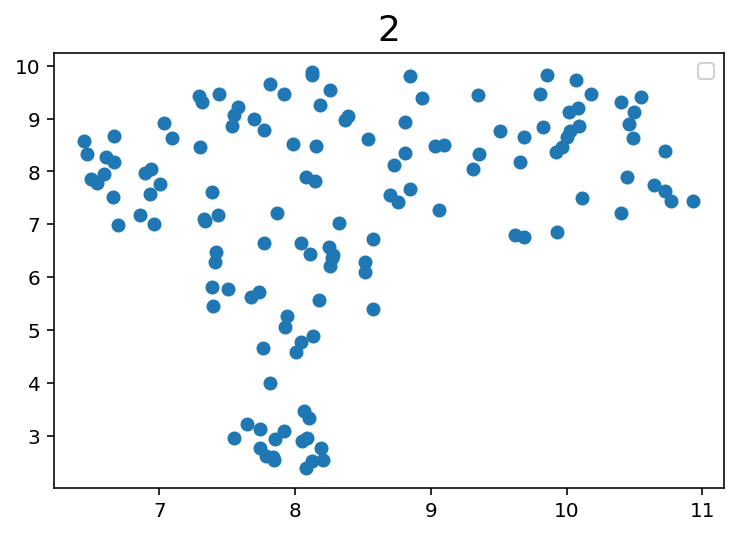

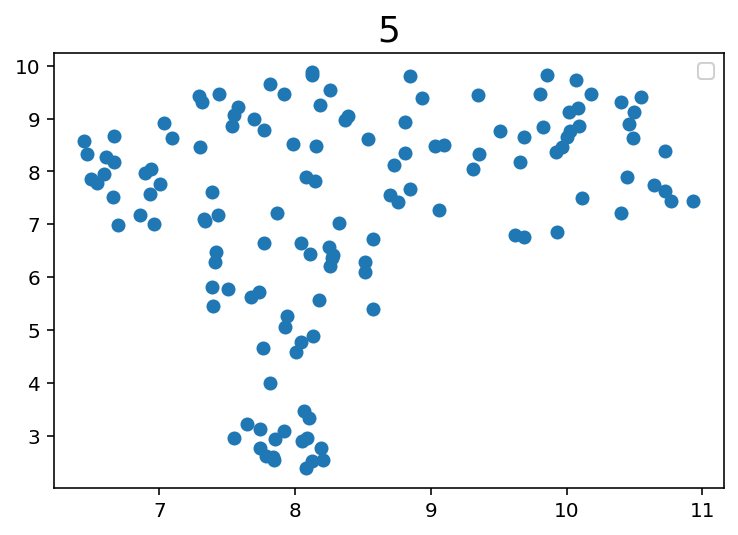

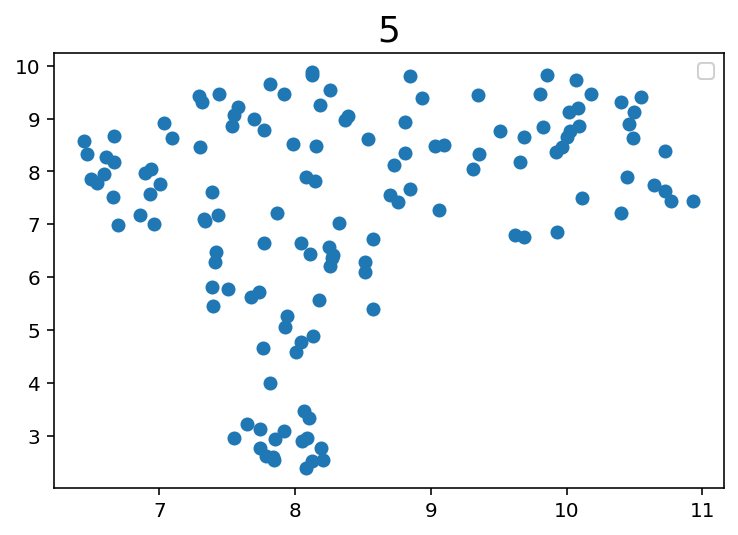

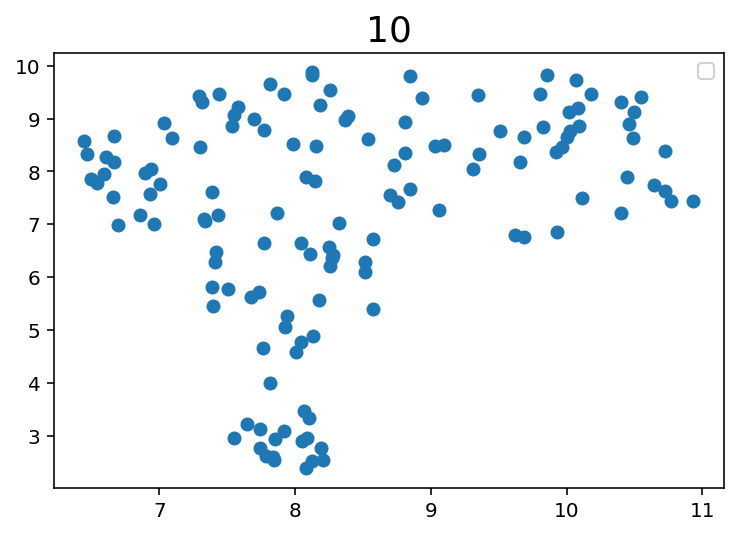

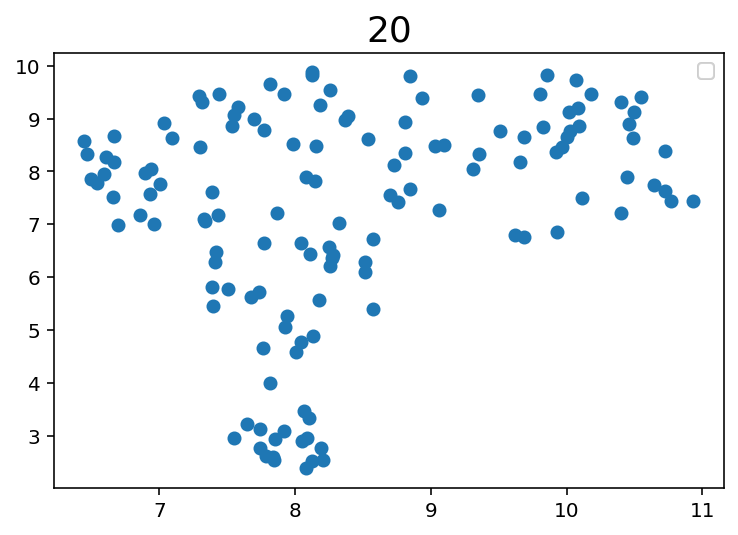

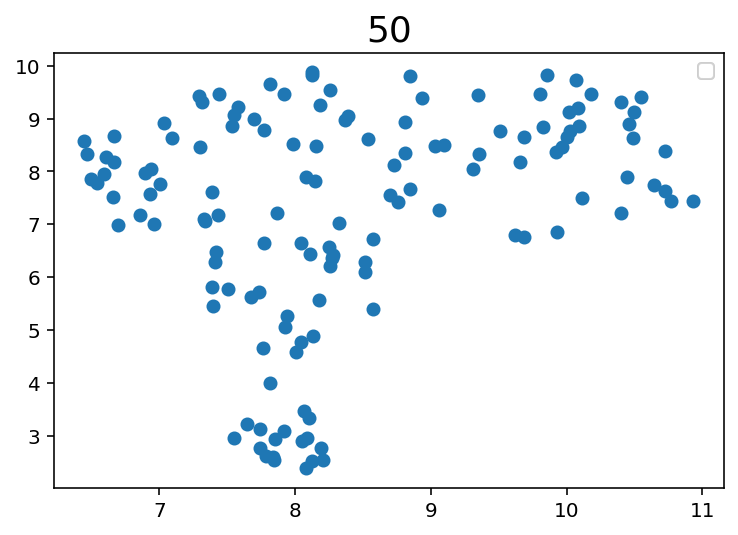

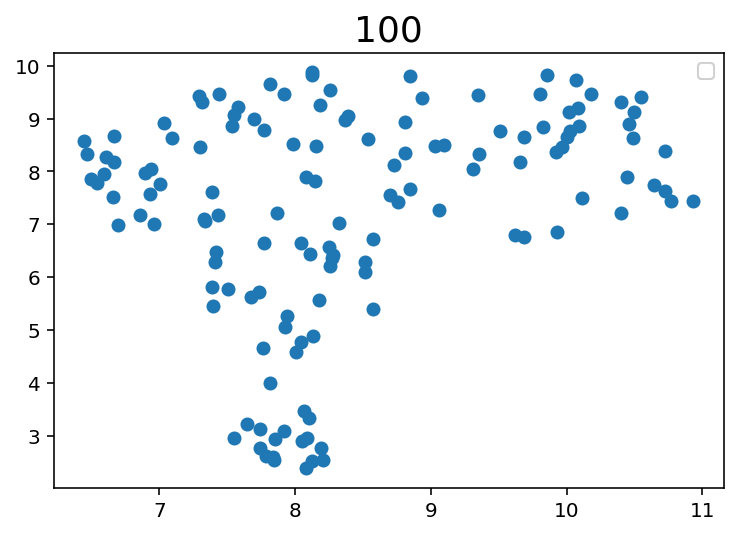

In [89]:
%%time

for n_neighbor in [2,5, 5,10,20,50,100]:
    utils.draw_umap(combined_embedding_df, n_neighbor=n_neighbor, title=str(n_neighbor))

In [90]:
combined_embedding_df

,Borough_Bronx,Borough_Brooklyn,"Borough_Brooklyn, Queens",Borough_Citywide,Borough_Manhattan,"Borough_Manhattan, Bronx","Borough_Manhattan, Staten Island, Bronx",Borough_Marlboro,Borough_New York,Borough_Olive,...,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original
0,0,0,0,0,0,0,0,0,0,0,...,0.7738084,1.3505087,1.3794651,1.7912412,3.7139347,1.0824528,-1.0593464,-0.5574244,-0.12282261,3.2443912
1,1,0,0,0,0,0,0,0,0,0,...,0.45560074,0.3102671,1.3891404,2.211406,1.8983381,0.16516134,-0.68083847,-1.65081,-0.777158,0.6327967
2,0,0,0,0,0,0,0,0,0,0,...,0.9744977,0.8479339,1.8745141,1.802774,2.96319,0.5198547,0.09993857,-0.12916394,0.15499067,2.3330388
3,0,0,0,1,0,0,0,0,0,0,...,0.46791083,2.0236218,1.5031482,2.076716,2.4177063,1.1945572,0.20789176,-0.37892795,-0.022360235,3.0018241
4,0,0,0,0,0,0,0,0,0,0,...,0.7790439,2.5116642,1.3957326,2.2206688,2.0186124,1.0768223,-0.16002703,-1.2541026,1.0126886,3.120361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,0,0,0,0,0,0,0,0,0,0,...,0.6607507,0.4595452,1.250858,1.8594915,2.717701,0.9793138,-0.8704622,-1.1529202,-0.47634968,2.6834874
130,0,1,0,0,0,0,0,0,0,0,...,0.8118902,0.48627004,1.1169052,3.0217793,2.9326305,1.9341428,-0.30735144,0.83507,-0.20022348,3.03116
131,0,0,0,0,0,0,0,0,0,0,...,1.2173837,1.4361173,0.8428758,2.158064,2.9408643,1.1322362,-1.175828,-1.740112,0.19337735,2.094018
132,0,0,0,0,0,0,0,0,0,0,...,0.45560074,0.3102671,1.3891404,2.211406,1.8983381,0.16516134,-0.68083847,-1.65081,-0.777158,0.6327967


In [91]:
%%time

combined_mapping_df_list =[]
mapper_dict["combined"] = {}

for dim in [2,5,10,50, 100]:
    mapping, mapper =  utils.draw_umap(combined_embedding_df, n_neighbor=5, plot=False, n_components=dim) 
    combined_mapping_df_list.append(pd.DataFrame(mapping, columns=[f"description_embedding_{dim}D"]* dim))
    mapper_dict["combined"][f"{dim}D"] = mapper

CPU times: user 5.35 s, sys: 817 ms, total: 6.16 s
Wall time: 4.53 s


In [92]:
df_to_transform.columns

Index(['Current_Project_Years', 'Current_Project_Year', 'Budget_Start',
       'Final_Change_Years', 'Budget_End', 'Number_Changes', 'Duration_Start',
       'Duration_End', 'Schedule_Change', 'Budget_Change',
       'Schedule_Change_Ratio', 'Budget_Change_Ratio', 'Budget_Abs_Per_Error',
       'Budget_Rel_Per_Error', 'Duration_End_Ratio', 'Budget_End_Ratio',
       'Duration_Ratio_Inv', 'Budget_Ratio_Inv'],
      dtype='object')

In [93]:
type(mapper_dict["combined"]["2D"])

umap.umap_.UMAP

In [94]:
columns

['PID',
 'Project_Name',
 'Description',
 'Category',
 'Borough',
 'Managing_Agency',
 'Client_Agency',
 'Phase_Start',
 'Current_Project_Years',
 'Current_Project_Year',
 'Design_Start',
 'Budget_Start',
 'Schedule_Start',
 'Final_Change_Date',
 'Final_Change_Years',
 'Phase_End',
 'Budget_End',
 'Schedule_End',
 'Number_Changes',
 'Duration_Start',
 'Duration_End',
 'Schedule_Change',
 'Budget_Change',
 'Schedule_Change_Ratio',
 'Budget_Change_Ratio',
 'Budget_Abs_Per_Error',
 'Budget_Rel_Per_Error',
 'Duration_End_Ratio',
 'Budget_End_Ratio',
 'Duration_Ratio_Inv',
 'Budget_Ratio_Inv']

In [95]:
len(all_cols_all_datasets)

63

In [96]:
len(umap_df.columns.symmetric_difference(all_cols_all_datasets))

0

In [97]:
umap_df.columns.symmetric_difference(all_cols_all_datasets)

Index([], dtype='object')

In [98]:
columns

['PID',
 'Project_Name',
 'Description',
 'Category',
 'Borough',
 'Managing_Agency',
 'Client_Agency',
 'Phase_Start',
 'Current_Project_Years',
 'Current_Project_Year',
 'Design_Start',
 'Budget_Start',
 'Schedule_Start',
 'Final_Change_Date',
 'Final_Change_Years',
 'Phase_End',
 'Budget_End',
 'Schedule_End',
 'Number_Changes',
 'Duration_Start',
 'Duration_End',
 'Schedule_Change',
 'Budget_Change',
 'Schedule_Change_Ratio',
 'Budget_Change_Ratio',
 'Budget_Abs_Per_Error',
 'Budget_Rel_Per_Error',
 'Duration_End_Ratio',
 'Budget_End_Ratio',
 'Duration_Ratio_Inv',
 'Budget_Ratio_Inv']

In [99]:
df_to_transform.columns

Index(['Current_Project_Years', 'Current_Project_Year', 'Budget_Start',
       'Final_Change_Years', 'Budget_End', 'Number_Changes', 'Duration_Start',
       'Duration_End', 'Schedule_Change', 'Budget_Change',
       'Schedule_Change_Ratio', 'Budget_Change_Ratio', 'Budget_Abs_Per_Error',
       'Budget_Rel_Per_Error', 'Duration_End_Ratio', 'Budget_End_Ratio',
       'Duration_Ratio_Inv', 'Budget_Ratio_Inv'],
      dtype='object')

In [100]:
columns_before_dummified

Index(['Borough', 'Category', 'Client_Agency', 'Managing_Agency',
       'Phase_Start', 'Budget_Start', 'Duration_Start'],
      dtype='object')

In [101]:
umap_df.columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Budget_Start', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_

In [102]:
embedding.head()

,PID,embedding,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,...,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original,description_embedding_original
0,3,"-0.13854653, 1.4585932, -6.7886453, 0.06109361...",-0.13854653,1.4585932,-6.7886453,0.061093614,0.7148117,0.43594462,-0.23744068,0.3534081,...,1.151537,1.329929,1.3608555,2.953014,2.9410653,0.8604974,-0.19378448,-0.34349686,0.2708969,3.2138045
1,7,"-0.13127574, 1.1954153, -6.7207437, 0.06122951...",-0.13127574,1.1954153,-6.7207437,0.06122951,0.80961025,0.44387937,-0.09895813,0.39786565,...,1.027053,1.0824411,1.2738218,2.5434253,2.2992206,-0.11788054,0.2098028,-0.41049436,-0.36708057,2.9890614
2,18,"0.09863796, 1.6704285, -6.5727553, 0.06882739,...",0.09863796,1.6704285,-6.5727553,0.06882739,0.77206296,0.55682564,-0.441742,0.90105414,...,1.1086549,0.42101243,0.8899111,2.3709288,1.8500209,0.9128254,-1.9147136,-1.4002768,-0.16849239,1.2008964
3,25,"-0.26632923, 1.1822444, -6.7360897, 0.06842376...",-0.26632923,1.1822444,-6.7360897,0.06842376,0.6305313,0.452769,-0.35671887,0.54343706,...,0.54704213,1.4249201,1.4830925,2.158951,3.4316707,1.8173983,-0.49943078,-0.39554152,0.07995346,1.7075143
4,34,"-0.35451388, 1.6325428, -6.692406, 0.10146355,...",-0.35451388,1.6325428,-6.692406,0.10146355,0.7334988,0.3255136,-0.4081904,0.46820372,...,0.80529124,0.6769039,1.2790774,2.6454213,1.3743583,1.5485067,-0.5840663,-0.6730428,0.11817476,1.9487768


In [103]:
columns_before_dummified

Index(['Borough', 'Category', 'Client_Agency', 'Managing_Agency',
       'Phase_Start', 'Budget_Start', 'Duration_Start'],
      dtype='object')

In [104]:
class UMAP_embedder(object):
    def __init__(self):
        self.initial_columns = columns
        #self.initial_columns = ['PID', 'Project_Name', 'Description', 'Category', 'Borough', 'Managing_Agency', 'Client_Agency', 'Phase_Start', 'Current_Project_Years', 'Current_Project_Year', 'Design_Start', 'Budget_Start', 'Schedule_Start', 'Final_Change_Date', 'Final_Change_Years', 'Phase_End', 'Budget_End', 'Schedule_End', 'Number_Changes', 'Duration_Start', 'Duration_End', 'Schedule_Change', 'Budget_Change', 'Schedule_Change_Ratio', 'Budget_Change_Ratio', 'Budget_Abs_Per_Error', 'Budget_Rel_Per_Error', 'Duration_End_Ratio', 'Budget_End_Ratio', 'Duration_Ratio_Inv', 'Budget_Ratio_Inv']
        self.scale_cols = df_to_transform.columns
#         self.scale_cols = ['Current_Project_Years', 'Current_Project_Year', 'Budget_Start',
#        'Final_Change_Years', 'Budget_End', 'Number_Changes', 'Duration_Start',
#        'Duration_End', 'Schedule_Change', 'Budget_Change',
#        'Schedule_Change_Ratio', 'Budget_Change_Ratio', 'Budget_Abs_Per_Error',
#        'Budget_Rel_Per_Error', 'Duration_End_Ratio', 'Budget_End_Ratio',
#        'Duration_Ratio_Inv', 'Budget_Ratio_Inv']
        self.scaler = transformer
#         self.cols_to_dummify = ['Borough', 'Category', 'Client_Agency', 'Managing_Agency',
#        'Phase_Start', 'Budget_Start', 'Duration_Start'] 
        self.cols_to_dummify = columns_before_dummified
        self.final_cols = list(umap_df.columns)
        self.mapper_dict = mapper_dict
        self.clusterer = clusterer
        self.embedding = embedding.drop(columns="embedding").reset_index().drop(columns="index")
        
    def get_mapping_attributes(self,df, return_extra=False, ):
        """
        if return extra = True, returns 3 objects:
            0. mapping
            1. columns needed to be added to harmonize with entire data
            2. dummified df before adding columns of [1]
        """
        raw_df = df[test_class.initial_columns]
        df_to_transform = df[self.scale_cols]#.drop(columns=["PID"])
        transformed_columns = pd.DataFrame(self.scaler.transform(df_to_transform), columns = df_to_transform.columns)
        scaled_df = (df[df.columns.difference(transformed_columns.columns)]).join(transformed_columns)
        dummified = pd.get_dummies(scaled_df[self.cols_to_dummify])
        
        added_cols = all_cols_all_datasets - set(dummified.columns)
        added_cols = {col: 0 for col in added_cols}
        
        dummified_full = dummified.assign(**added_cols)
        dummified_full = dummified_full[self.final_cols]
        mapping_df_list =[]
        
        for mapper in mapper_dict["attributes"].values():
            
            mapping = mapper.transform(dummified_full)
            mapping_df = pd.DataFrame(mapping, columns= [f"umap_attributes_{mapping.shape[1]}D_embed_{col+1}" for col in range(mapping.shape[1])])
            mapping_df_list.append(mapping_df)
            
        final_df = pd.concat(mapping_df_list, axis=1)
        final_df["PID"] = scaled_df["PID"]
        
        if return_extra:
            return final_df, added_cols, scaled_df, dummified
        else:
            return final_df
       
    def get_mapping_description(self, df):
        
        merged = df[["PID"]].merge(self.embedding, on = "PID", how="left").drop(columns="PID")
#         print(df.shape)
#         print(merged.shape)
#         display(merged)
        mapping_df_list =[merged]
        #mapping_columns = [list(self.embedding.columns.copy())]
        for mapper in mapper_dict["description"].values():
            mapping = mapper.transform(merged)
            mapping_df = pd.DataFrame(mapping, columns= [f"umap_descr_{mapping.shape[1]}D_embed_{col+1}" for col in range(mapping.shape[1])])
            mapping_df_list.append(mapping_df)
           # mapping_columns += list(mapping_df.columns.copy())
                                   
        final_df = pd.concat(mapping_df_list, axis=1)
        #final_df.columns = mapping_columns
#         print(final_df.shape)
#         print(df["PID"].shape)
        final_df["PID"] = df["PID"].values
        
        return final_df
    
    def get_full_df(self, df):
        attribute_df = self.get_mapping_attributes(df)
        description_df = self.get_mapping_description(df)
        labels, probabilities = self.get_clustering(attribute_df[["umap_attributes_2D_embed_1", "umap_attributes_2D_embed_2"]])
        full_df = description_df.merge(attribute_df, on = "PID", how="left")
        full_df["PID"] = attribute_df["PID"].values
        full_df["attribute_clustering_label"] = labels
        return full_df
    
    def get_clustering(self, attributes_2D_mapping):
        assert attributes_2D_mapping.shape[1] ==2
        new_labels = hdbscan.approximate_predict(clusterer, attributes_2D_mapping)
        return new_labels
        
test_class = UMAP_embedder()
test_class

In [105]:
dump(transformer, open("../models/UMAP_fitted_robust_scaler.pickle", "wb"))

dump(clusterer, open("../models/UMAP_fitted_HDBSCAN.pickle", "wb"))

dump(umap_df.columns, open("../models/UMAP_final_cols.pickle", "wb"))

dump(mapper_dict, open("../models/UMAP_mapper_dict.pickle", "wb"))

In [106]:
# test_class.get_mapping_attributes(data_dict["NYC_capital_projects_3yr"])["PID"]

# test_class.get_mapping_attributes(pd.read_excel("../data/interim/NYC_capital_projects_3yr_test.xlsx").drop(columns="Category").rename(columns={"Category_Old": "Category"}))

# test_class.get_mapping_description(data_dict["NYC_capital_projects_3yr"])

# test_class.get_clustering((test_class.get_mapping_attributes(data_dict["NYC_capital_projects_3yr"])[["attributes_2D"]]))

# test_set_embeddings = test_class.get_full_df(pd.read_csv("../data/processed/NYC_capital_projects_3yr_test.csv").drop(columns="Category").rename(columns={"Category_Old": "Category"}))
# test_set_embeddings

# test_set_embeddings.to_csv("../data/interim/UMAP_embeddings_NYC_capital_projects_3yr_test.csv", index=False)

# train_set_embeddings = test_class.get_full_df(pd.read_csv("../data/processed/NYC_capital_projects_3yr_train.csv").drop(columns="Category").rename(columns={"Category_Old": "Category"}))

# train_set_embeddings[["umap_attributes_2D_embed_1", "umap_attributes_2D_embed_2"]].plot.scatter("umap_attributes_2D_embed_1", "umap_attributes_2D_embed_2")

# train_set_embeddings = test_class.get_full_df(pd.read_csv("../data/processed/NYC_capital_projects_3yr_train.csv").drop(columns="Category").rename(columns={"Category_Old": "Category"}))

# train_set_embeddings.to_csv("../data/processed/UMAP_embeddings_NYC_capital_projects_3yr_train.csv", index=False)

In [107]:
# df_to_transform.info()

# pd.read_csv("../data/interim/all_years_df")[test_class.scale_cols].info()#.isnull().sum().

# test_class.get_mapping_attributes(pd.read_csv("../data/interim/all_years_df"))[["umap_attributes_2D_embed_1", "umap_attributes_2D_embed_2"]].plot.scatter("umap_attributes_2D_embed_1", "umap_attributes_2D_embed_2")

# UMAP_all_years_embedding = test_class.get_f(pd.read_csv("../data/interim/all_years_df"))

# UMAP_all_years_embedding.to_csv("../data/interim/UMAP_embeddings_all_years", index= False)

# pd.read_csv(f"../data/interim/NYC_capital_projects_{year}yr.csv").repace

# df_to_embed[~df_to_embed['Budget_Abs_Per_Error'].replace([np.inf, -np.inf], np.nan).isna()].dropna()

# df_to_embed.isnull().sum().sum()

# for year in [1,2,4]:
#     df_to_embed = pd.read_csv(f"../data/interim/NYC_capital_projects_{year}yr.csv")
#     print(df_to_embed.shape)
#     df_to_embed = df_to_embed[~df_to_embed['Budget_Abs_Per_Error'].replace([np.inf, -np.inf], np.nan).isna()].dropna()
#     df_to_embed.to_csv(f"../data/interim/fixed_inf_NYC_capital_projects_{year}yr.csv")
#     embedding_df_year = test_class.get_full_df(df_to_embed)
#     embedding_df_year.to_csv(f"../data/interim/UMAP_embeddings_NYC_capital_projects_{year}yr.csv")